# This notebook 
#### 1. Get the time series from the selected lakes
#### 2. Get data from selected lakes
#####    - Lake shapefile, area
#####    - Lake ice
#### 3. Preprocess ground observation of the selected lakes individually
#### 4. Save dataframe will all the time series preprocessed 
#### 5. Preprocess altis data of the selected lakes 
##### 5.1 Plot the influence on the number of matchups based in the method used
#### 6. Generate the matching time series of ground and altimeter observations
#### 7. Generate the matching time series of ground and altimeter observations in SAR mode

# Libraries to import 

In [1]:
from ground_data import GroundObservations
from ts_preprocesing import * 
from ts_plots import *

import geopandas as gpd
import platform
import scipy.interpolate as sc
import geopandas as gpd
import importlib
import pandas as pd
import os
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import pytz

from timezonefinder import TimezoneFinder
from pytz import timezone
import timeit
from datetime import datetime
from icecream import ic

utc=pytz.utc
utc.zone
%reload_ext autoreload
%autoreload 2

## Free memory

In [2]:
import gc
gc.collect()

63

In [23]:
# from LOCSS_data_structure import GaugeCollection
# def get_locss(source, date_fd=None, id_fd=None, height_fd=None, station_id=None, all_fds=False):
#     #Tested with source only rest values by default
#     #For now the data is saved in a fix rout, this has to change later when I get the API
#     dir_ts='../data/source_in_situ/NewReview_TS_LOCSS_2G_Gauge/lake_heights_FDN2_2017-01-01_2025-04-28.csv'
#     dir_loc='../data/source_in_situ/NewReview_TS_LOCSS_2G_Gauge/gauges_list.csv'
#     if date_fd is None: #Tested
#         date_fd='date'
#         #time_fd='time'
#     if id_fd is None: #Tested
#         id_fd='gauge_id' 
#     if height_fd is None: #Tested
#         height_fd='height'
#     #Load the time series
#     df_locss=pd.read_csv(dir_ts, parse_dates=[date_fd])

#     #Read the coordinates
#     df_gauges=pd.read_csv(dir_loc, sep=",")
#     if station_id is not None:
#         if isinstance(station_id, list):
#             id_list=df_gauges.loc[df_gauges[id_fd].isin(station_id), id_fd].unique()
#         else:
#             print('Must be a list')
#     else: #Take all the gauges        
#         id_list=df_gauges[id_fd].unique()
    
#     for d_id in id_list:
#         df=df_locss.loc[df_locss[id_fd]==d_id].copy()
#         df_fo_readings=pd.DataFrame()
#         if not df.empty:
#             time_zone=df_gauges.loc[df_gauges[id_fd]==d_id, 'timezone'].values[0]
#             min_height=df_gauges.loc[df_gauges[id_fd]==d_id, 'min_height'].values[0]
#             max_height=df_gauges.loc[df_gauges[id_fd]==d_id, 'max_height'].values[0]
#             gauge_id=df_gauges.loc[df_gauges[id_fd]==d_id,'gauge_id'].values[0]
#             unit=df_gauges.loc[df_gauges[id_fd]==d_id, 'unit'].values[0]
#             name=df_gauges.loc[df_gauges[id_fd]==d_id, 'name'].values[0]
#             lat=df_gauges.loc[df_gauges[id_fd]==d_id, 'latitude'].values[0]
#             long=df_gauges.loc[df_gauges[id_fd]==d_id, 'longitude'].values[0]
            
#             df['datetime_utc'] = pd.to_datetime(df[date_fd], format='%Y-%m-%d HH:MM:SS')#.dt.strftime('%Y-%m-%d')+' '+df['timeUTC']
#             df['min_height']=min_height
#             df['max_height']=max_height
#             df['gauge_id']=gauge_id
#             df['unit']=unit
#             df['name']=name
#             df['latitude']=lat
#             df['longitude']=long
#             # print(df.head())
#             df_fo_readings=pd.concat([df_fo_readings, df])
#     #df_coord_locss['location']=df_coord_locss[id_fd].str.slice(2,4)

#     gc=GaugeCollection()
#     df_locss_filtered=gc.filter_test_gages(df_fo_readings,id_fd).copy()
#     # #Convert field to datetime
#     # df_locss_filtered[date_fd]=pd.to_datetime((df_locss_filtered[date_fd].astype(str)+' '+df_locss_filtered[time_fd].astype(str)), 
#     #                                           format='%Y-%m-%d %H:%M:%S')
#     # if all_fds==False:
#     #     df_locss_filtered=pd.merge(df_locss_filtered, df_coord_locss[[id_fd,'min_height','max_height', 'unit']], on=id_fd)
#     # else:
#     #     df_locss_filtered=pd.merge(df_locss_filtered, df_coord_locss, on=id_fd)
#     df_locss_filtered=df_locss_filtered.loc[(df_locss_filtered[height_fd]>=df_locss_filtered['min_height'])&
#                                             (df_locss_filtered[height_fd]<=df_locss_filtered['max_height'])].copy()
#     df_locss_filtered['source']=source
   
#     # df_locss_filtered=self._unify_cols(df_locss_filtered, id_fd, date_fd, height_fd)
#     return df_locss_filtered

# 1. Get the time series from the selected lakes
###  Getting locss stations

In [4]:
# Getting locss stations

go=GroundObservations()
height_fd='height'

lc_lakes=['KHB2','HMT2','PHN2','SAW2','BTN2','QUL2', 'WEW2', 'CFN2','YSL2','SLL2','TAB2','MAB2', 'CQK2', 'SKT2', 'MCW2', 'PAW2', 'MRP2', 'SPA2', 'BLB2','RLH2','MTN2', 'VCN2', 'FDN2']

####NOTE
#VNC2 is the other gauge in Mattamuskeet 
#FDN2 is the other gauge in Phelps


#Read only data from the lakes with the codes specified in lc_lakes
df_locss=go.read_ground_data('LOCSS', station_id=lc_lakes)
df_locss=get_date_time_cols(df_locss, 'date', has_hour=True) #Expand date details in coloumns

df_locss['date']=[x.replace(tzinfo=None) for x in pd.to_datetime(df_locss['date'], utc=True)]

stations=df_locss['gauge_id'].unique()

#Unify all the units to the metric system
df_final=convert_units(df_locss,height_fd, origin='FEET', to='METER', unit_fd='unit',
                  gauge_fd='gauge_id')

#Extract gauges that are not operational less than 2 data
lk_id_fd='gauge_id'

df_readings_count=df_final.groupby([lk_id_fd], as_index=False).size()
no_operational_gauges=df_readings_count.loc[df_readings_count['size']<=2][lk_id_fd]


df_final=df_final.loc[~df_final[lk_id_fd].isin(no_operational_gauges)]
print('Initial size',df_final.shape)

#Calculate the differences between consecutive values and dates
#Remove and process duplicate dates

cut_off=0.05 #cut_off for the standard deviation

gauges_list=lc_lakes#df_final[st_id].unique()

date_fd='date'
cols=['gauge_id', 'name', 'date', 'height_rw',
       'min_height', 'max_height', 'unit', 'source',
       'year', 'month', 'day', 'hour', 'decimal_y']

#use help to see the desciption of filter_extreme_duplicates. i.e., help(filter_extreme_duplicates)         
df_final_nd, df_final_removed, discarded, n_duplicated=filter_extreme_duplicates(df_final, lk_id_fd, date_fd,height_fd, cols, cut_off, gauge_list=gauges_list, exact_date=False)

#Total values outside the cut off. These were filtered out
print("Total values outside cut off: "+str(discarded)+"\n")#df_final_removed[['gauge_id', 'height_count', 'date', 'time', 'height_std']])
print("Total duplicated values: "+str(n_duplicated))
# print("Gauges with values in the same date: \n", df_final_nd.gauge_id.unique())

# df_final_nd.gauge_id.unique()
# gauges_list
df_final_nd.rename(columns={'height_rc':height_fd}, inplace=True)
# df_final_nd
# #Extract the ones with duplicates from df_final
df_temp=df_final.loc[~df_final[lk_id_fd].isin(df_final_nd[lk_id_fd].unique())]


df_temp
df_temp=pd.concat((df_temp, df_final_nd), axis=0)
print('Final size',df_temp.shape)
#Total save data for suplememntal material 

df_temp.loc[~(df_temp['height_count'].isnull())&(df_temp['height_count']>=2)].to_csv('../data/for_paper/sumary_LOCSS_same_date_r2025.csv')
df_final_removed.to_csv('../data/for_paper/LOCSS_removed_cut_off_r2025.csv')

Initial size (5500, 19)
Total values outside cut off: 0

Total duplicated values: 21
Final size (5479, 21)


In [5]:
df_locss.head()

,gauge_id,name,latitude,longitude,date,height,min_height,max_height,unit,is_bubble_level_okay,notes,datetime_utc,source,year,month,day,hour,decimal_y
23620,BTN2,Bay Tree Lake,34.683093,-78.416193,2017-06-12 22:36:14,1.35,0.0,3.33,FEET,1,Text read: current height around 1.35 wavy bet...,2017-06-12 22:36:14+00:00,LOCSS,2017,6,12,22,2017.446416
23621,BTN2,Bay Tree Lake,34.683093,-78.416193,2017-04-18 16:24:13,1.74,0.0,3.33,FEET,1,Initial reading,2017-04-18 16:24:13+00:00,LOCSS,2017,4,18,16,2017.295023
23622,BTN2,Bay Tree Lake,34.683093,-78.416193,2017-04-23 16:01:31,1.70,0.0,3.33,FEET,1,Actual text read 1.7,2017-04-23 16:01:31+00:00,LOCSS,2017,4,23,16,2017.308679
23623,BTN2,Bay Tree Lake,34.683093,-78.416193,2017-07-10 22:21:00,1.15,0.0,3.33,FEET,1,Text,2017-07-10 22:21:00+00:00,LOCSS,2017,7,10,22,2017.523099
23624,BTN2,Bay Tree Lake,34.683093,-78.416193,2017-06-30 23:14:37,1.35,0.0,3.33,FEET,1,wavy and windy but seems average around 1.35,2017-06-30 23:14:37+00:00,LOCSS,2017,6,30,23,2017.495804


# 1. Get the time series from the selected lakes
### Getting ARHN stations from file
### Getting USGS stations from file. Still working on R script connection to get them from USGS
### Getting Brazilian Reservoirs from file

In [6]:
# Getting ARHN stations 

# #'2102' Is a meteorlogical station 
ar_lakes=['1824', '2830', '1830','2832', '2028','2231','2234','2300','2316']#'1805', '1819',
skip_rows=1

df_arhn=go.read_ground_data('ARHN', skip_rows=skip_rows, station_id=ar_lakes)
df_arhn=get_date_time_cols(df_arhn, 'date', has_hour=True)

# Getting USGS stations from file. Still working on R script connection
us_lakes=['2464800','6903880','6604000']
df_usgs=go.read_ground_data('USGS',station_id=us_lakes)
df_usgs=get_date_time_cols(df_usgs, 'date')
df_usgs=convert_units(df_usgs,height_fd, origin='FEET', to='METER', 
                  gauge_fd='gauge_id')

# Getting Brazilian Reservoirs
rvbr_lakes=['19069','19060','19126', '12030', '12036', '12327','12056']
df_rvbr=go.read_ground_data('RVBR', station_id=rvbr_lakes)
df_rvbr=get_date_time_cols(df_rvbr,'date')

#### Concat all the ground observations in a single dataframe

In [7]:
#Relevant columns
# df_ground_ts=pd.DataFrame()
common_cols=['gauge_id','source','decimal_y','height','date','year', 'month', 'day', 'hour']
# df_usgs[common_cols]
df_ground_ts=pd.concat((df_usgs[common_cols].copy(),df_arhn[common_cols].copy(), df_temp[common_cols].copy(), df_rvbr[common_cols].copy()), axis=0)

# df_ground_ts=df_temp[common_cols].copy()
df_ground_ts['doy']=pd.to_datetime(df_ground_ts['date'], utc=True).dt.dayofyear
df_ground_ts.shape
# pd.datetime(+pd.to_datetime(df_final['time'], format='%H:%M:%S'), format='%Y-%m-%d %H:%M:%S')
# df_ground_ts.columns

(364295, 10)

# 2. Get data from selected lakes
###   - Lake shapefile, area, lake name
###   - Lake ice
###  Generate the file with all the initial preprocesing 

In [8]:
#Get all lakes 

path_lakes='../data/shapes/all_lakes_paper.shp'#wgs84_f.shp'

df_sel_lakes=gpd.read_file(path_lakes)

#Read all the gauges with time series to process. This file contain the lake ids that will be used in the computated. It is used to filter the shapefile dataframe
path= '../data/alti_timeseries/lonlat_vs_altis_ed_r2025.csv'#lonlat_vs_altis_ed.csv'


if platform.system()=='Linux':
    altis_csv=pd.read_csv(path, sep=',',encoding='iso-8859-1')
else:
    altis_csv=pd.read_csv(path, sep=',', encoding='windows-1252')  

selected_lakes=altis_csv['lake_id'].dropna().unique()
selected_lakes=[str(int(x)) for x in selected_lakes]
#merge name based on gauge_id
df_lake_name=df_sel_lakes.loc[df_sel_lakes['lake_id'].isin(selected_lakes), ['gauge_id','lake_name', 'lake_id']]

# Manually add gauge ids of lakes that have more than one gauge and did not have gauge id
temp_2gauge=df_lake_name.loc[(df_lake_name['gauge_id']=='PHN2')|(df_lake_name['gauge_id']=='MTN2')].copy()
temp_2gauge['gauge_id']=None
df_lake_name=pd.concat([df_lake_name,temp_2gauge])

for index,x in df_lake_name.loc[df_lake_name['gauge_id'].isna()].iterrows():
    lkid=x['lake_id']
    gauge_id=altis_csv.loc[altis_csv['lake_id']==int(lkid), 'station_id'].values[0]
    df_lake_name.loc[df_lake_name['lake_id']==lkid, 'gauge_id']=gauge_id

df_ground_ts=pd.merge(df_ground_ts, df_lake_name, on='gauge_id',how='left')

In [331]:
#Section discarted 
#Add the ice covered from Xiao's code

# df_ice=pd.read_csv('../data/locss_ice.csv')
# df_ice
# df_ice=pd.merge(df_ice, df_sel_lakes[['Hylak_id', 'gauge_id']], on='Hylak_id', how='left')
# df_ground_ts=pd.merge(df_ground_ts, df_ice[['Hylak_id', 'gauge_id','SLIDE_snowIce','doy']], on=['gauge_id','doy'], how='left')
# df_ground_ts.to_csv('../data/temp_sample_LOCSS_data.csv')


# 3. Preprocess ground observation of the selected lakes individually

In [18]:
# first, create a copy just in case
df_ground_ts_org=df_ground_ts.copy()

In [17]:
# df_ground_ts=df_ground_ts_org.copy()


In [19]:
#Function to plot before and after
import matplotlib.ticker as ticker
def plot_ts_preproc(df_before, df_after, st_id, date_fd, height_fd, labels):
    title=labels['title']['label']
    title_s=labels['title']['size']
    x_label=labels['x']['label']
    y_label=labels['y']['label']
    xl_font_size=labels['x']['font_lbl_s']
    x_interval=labels['x']['freq_interval']
    yl_font_size=labels['y']['font_lbl_s']
    xl_tick_size=labels['x']['tick_s']
    yl_tick_size=labels['y']['tick_s']
    
    df1=df_before
    df1=df1.sort_values(by=date_fd)
    fig1, ax= plt.subplots(figsize=(20, 6))
    plt.plot(df1[date_fd], df1[height_fd], linewidth=5)
    plt.title(st_id+' before'+title, fontsize=title_s)

    ax.set_xlabel(x_label, fontsize=xl_font_size)
    ax.set_ylabel(y_label,fontsize=yl_font_size)
    
    ax.set_yticks(ax.get_yticks())
    ax.set_xticks(ax.get_xticks())
    
    ax.set_yticklabels(ax.get_yticks(),size = yl_tick_size)
    
    # Make ticks on occurrences of each month:
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    # Get only the month to show in the x-axis:
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=x_interval))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.set_xlim(df1[date_fd].min(), df1[date_fd].max())
    plt.xticks(fontsize=xl_tick_size)
    plt.gcf().autofmt_xdate()
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
    plt.subplots_adjust(bottom=0.15)
    
    for pos in ['top', 'right']:
        plt.gca().spines[pos].set_visible(False)
    
    
    df1=df_after
    df1=df1.sort_values(by=date_fd)
    fig2, ax=plt.subplots(figsize=(20, 6))
    plt.plot(df1[date_fd], df1[height_fd], linewidth=5)
    plt.title(st_id+' after'+ title, fontsize=title_s)
    ax.set_xlabel(x_label, fontsize=xl_font_size)
    ax.set_ylabel(y_label,fontsize=yl_font_size)

    ax.set_yticks(ax.get_yticks())
    ax.set_xticks(ax.get_xticks())
    
    ax.set_yticklabels(ax.get_yticks(),size = yl_tick_size)
    
    # Make ticks on occurrences of each month:
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    # Get only the month to show in the x-axis:
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=x_interval))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.set_xlim(df1[date_fd].min(), df1[date_fd].max())
    plt.xticks(fontsize=xl_tick_size)
    plt.gcf().autofmt_xdate()
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
    plt.subplots_adjust(bottom=0.15)
    for pos in ['top', 'right']:
        plt.gca().spines[pos].set_visible(False)
    return fig1, fig2
    

### Extract and move reference point of the stations KHB2
#### Reason: The gauge is moved during the monitoring, the reference point moves as well


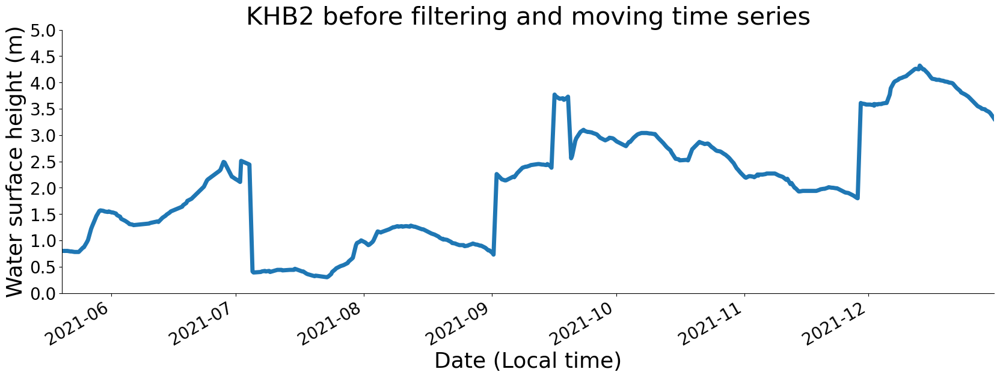

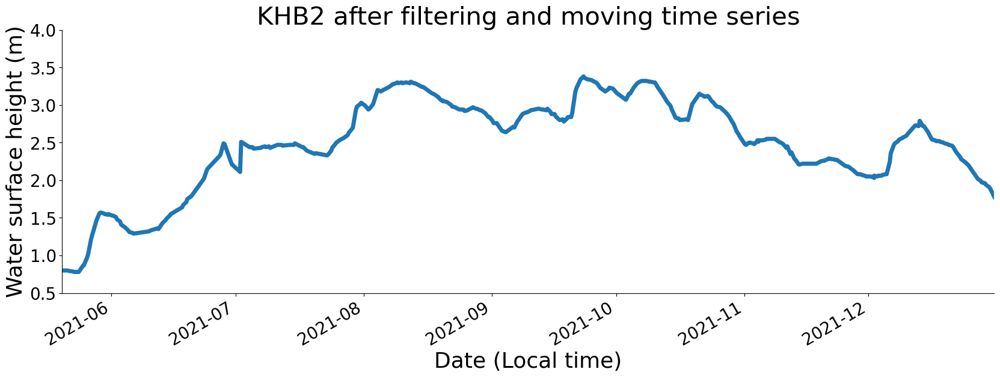

In [20]:
import matplotlib.dates as mdates

df=df_ground_ts.copy()
st_id_fd='gauge_id'
st_id='KHB2'
date_fd='decimal_y'
height_fd='height'
low_lim=-.5
high_lim=.5

df_ground_ex, df_ground_re,df_diff_to_remove=extract_data_gauge(df, st_id_fd, st_id, date_fd, height_fd, low_lim, high_lim)
df_diff_to_remove
date_fd='date'
diff_fd='diff'



if df_diff_to_remove.empty:
    df1=df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id]
    fig, ax=plt.subplots(figsize=(20, 6))
    ax.plot(df1[date_fd], df1[height_fd])
    plt.title(st_id+' Already ok', fontsize=20)
    # ax=plt.gcf()
    # label = ax.yaxis.get_major_ticks()[2].label
    ax.set_xlabel('Date (Local time)', fontsize=18)
    ax.set_ylabel('Water surface height (m)',fontsize=18)
    ax.set_yticklabels(ax.get_yticks(),size = 16)
    # ax.set_xticklabels(ax.get_xticks(),size = 16)
    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f')
    # Make ticks on occurrences of each month:
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    # Get only the month to show in the x-axis:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.xticks(fontsize=16)
    ax.set_xlim(df1[date_fd].min(), df1[date_fd].max())
    for pos in ['top', 'right']:
        plt.gca().spines[pos].set_visible(False)
    
else:
    df_ground_fixed=remove_extreme_data(df_ground_ex,df_diff_to_remove, date_fd, height_fd, diff_fd)
    df_ground_ts=pd.concat((df_ground_re,df_ground_fixed), axis=0)

    #plot goes in here
    title=' filtering and moving time series'
    labels={'title':{'label':title, 'size':30},
       'x':{'label':'Date (Local time)', 'font_lbl_s':26, 'tick_s':20,'freq_interval':1},
       'y':{'label':'Water surface height (m)', 'font_lbl_s':26,'tick_s':20 }
       }

    # labels=dict({'title': title, 'y': 'Water Surface Height (m)'})

    fig1, fig2=plot_ts_preproc(df_ground_ex,df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id], st_id, date_fd, height_fd, labels)

# ax=plt.gfc()

### Save figures for supplemental material in the paper

In [13]:
fig1.savefig('../data/for_paper/Fig_S1_a.png', transparent=True, dpi=300)
fig2.savefig('../data/for_paper/Fig_S1_b.png', transparent=True, dpi=300)

### Extract and move reference point of the stations TAB2
#### Reason: The gauge is moved during the monitoring, the reference point moves as well

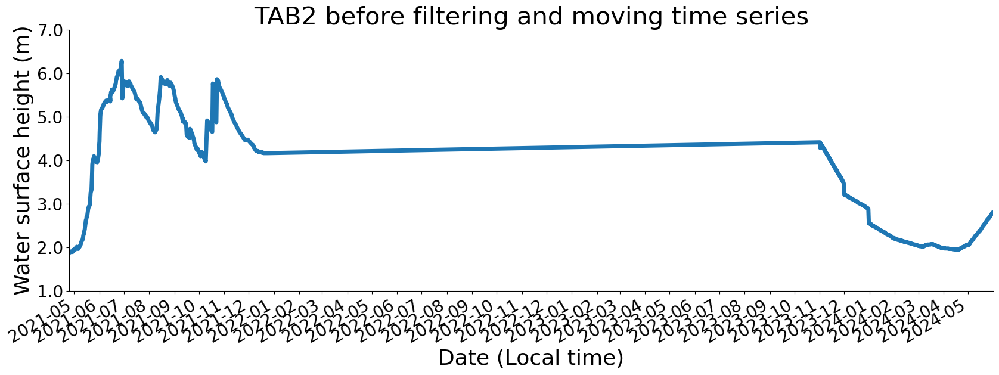

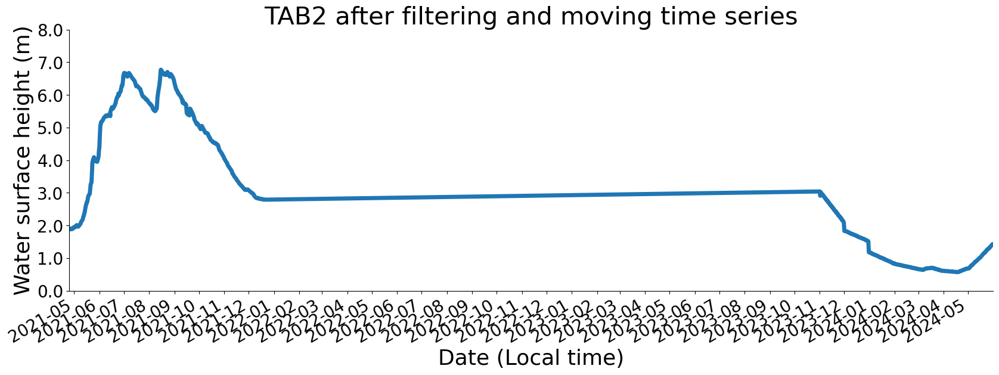

In [21]:
df=df_ground_ts.copy()
st_id_fd='gauge_id'
st_id='TAB2'
date_fd='decimal_y'
height_fd='height'
low_lim=-.5
high_lim=.5

df_ground_ex, df_ground_re,df_diff_to_remove=extract_data_gauge(df, st_id_fd, st_id, date_fd, height_fd, low_lim, high_lim)
df_diff_to_remove
date_fd='date'
diff_fd='diff'



if df_diff_to_remove.empty:
    df1=df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id]
    fig, ax=plt.subplots(figsize=(20, 6))
    ax.plot(df1[date_fd], df1[height_fd])
    plt.title(st_id+' Already ok', fontsize=20)
    # ax=plt.gcf()
    # label = ax.yaxis.get_major_ticks()[2].label
    ax.set_xlabel('Date (Local time)', fontsize=18)
    ax.set_ylabel('Water surface height (m)',fontsize=18)
    ax.set_yticklabels(ax.get_yticks(),size = 16)
    # ax.set_xticklabels(ax.get_xticks(),size = 16)
    # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f')
    # Make ticks on occurrences of each month:
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    # Get only the month to show in the x-axis:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.xticks(fontsize=16)
    ax.set_xlim(df1[date_fd].min(), df1[date_fd].max())
    for pos in ['top', 'right']:
        plt.gca().spines[pos].set_visible(False)
    
else:
    df_ground_fixed=remove_extreme_data(df_ground_ex,df_diff_to_remove, date_fd, height_fd, diff_fd)
    df_ground_ts=pd.concat((df_ground_re,df_ground_fixed), axis=0)

    #plot goes in here
    title=' filtering and moving time series'
    labels={'title':{'label':title, 'size':30},
       'x':{'label':'Date (Local time)', 'font_lbl_s':26, 'tick_s':20,'freq_interval':1},
       'y':{'label':'Water surface height (m)', 'font_lbl_s':26,'tick_s':20 }
       }

    # labels=dict({'title': title, 'y': 'Water Surface Height (m)'})

    fig1, fig2=plot_ts_preproc(df_ground_ex,df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id], st_id, date_fd, height_fd, labels)


### Save figures for supplemental material in the paper

In [15]:
fig1.savefig('../data/for_paper/Fig_S1_c.png', transparent=True, dpi=300)
fig2.savefig('../data/for_paper/Fig_S1_d.png', transparent=True, dpi=300)

### Extract anomalous values stations MTN2 (Lake Mattamuskeet West)
#### Reason: There is a extreme value TO-DO: Pending to describe this better

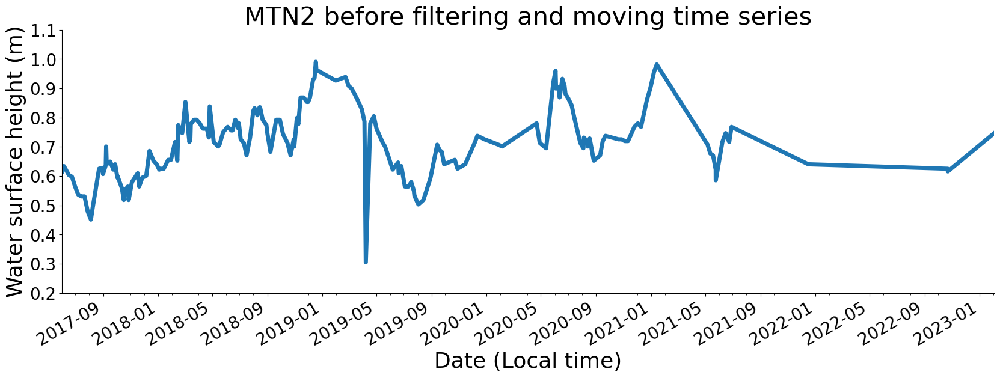

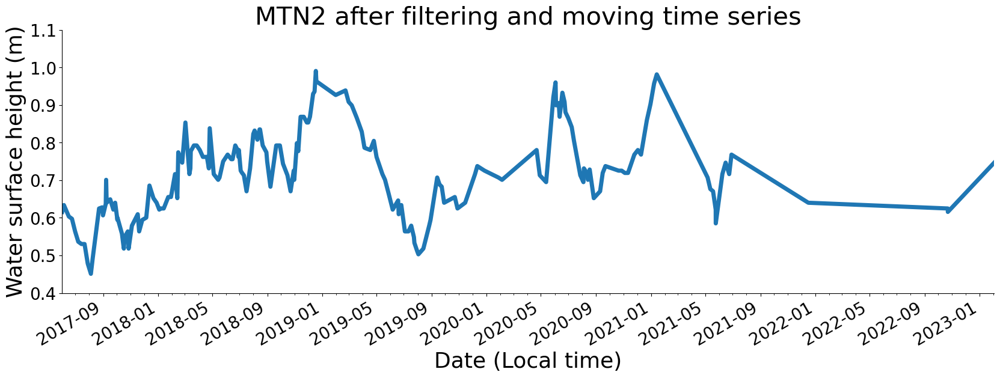

In [22]:
import matplotlib.ticker as ticker
df=df_ground_ts.copy()
st_id_fd='gauge_id'
st_id='MTN2'
date_fd='decimal_y'
height_fd='height'
low_lim=-.4
high_lim=.4

df_ground_ex, df_ground_re,df_diff_to_remove=extract_data_gauge(df, st_id_fd, st_id, date_fd, height_fd, low_lim, high_lim)
df_diff_to_remove
date_fd='date'
diff_fd='diff'



if df_diff_to_remove.empty:
    df1=df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id]
    fig, ax=plt.subplots(figsize=(20, 6))
    ax.plot(df1[date_fd], df1[height_fd])
    plt.title(st_id+' Already ok', fontsize=20)
    # ax=plt.gcf()
    # label = ax.yaxis.get_major_ticks()[2].label
    ax.set_xlabel('Date (Local time)', fontsize=18)
    ax.set_ylabel('Water surface height (m)',fontsize=18)
    
    # ax.set_xticklabels(ax.get_xticks(),size = 16)
    
    ax.set_yticklabels(ax.get_yticks(),size = 16)
    # Make ticks on occurrences of each month:
    ax.xaxis.set_major_locator(ticker.FixedLocator(mdates.MonthLocator()))
    ax.xaxis.set_minor_locator(ticker.FixedLocator(mdates.MonthLocator()))
    # Get only the month to show in the x-axis:
    ax.xaxis.set_major_locator(ticker.FixedLocator(mdates.MonthLocator(interval=4)))
    ax.xaxis.set_major_formatter(ticker.FixedLocator(mdates.DateFormatter('%Y-%m')))
    
    plt.xticks(fontsize=16)
    ax.set_xlim(df1[date_fd].min(), df1[date_fd].max())
    plt.gcf().autofmt_xdate()
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
    for pos in ['top', 'right']:
        plt.gca().spines[pos].set_visible(False)
    
else:
    df_ground_fixed=remove_extreme_data(df_ground_ex,df_diff_to_remove, date_fd, height_fd, diff_fd)
    df_ground_ts=pd.concat((df_ground_re,df_ground_fixed), axis=0)

    #plot goes in here
    title=' filtering and moving time series'
    labels={'title':{'label':title, 'size':30},
       'x':{'label':'Date (Local time)', 'font_lbl_s':26, 'tick_s':20, 'freq_interval':4},
       'y':{'label':'Water surface height (m)', 'font_lbl_s':26,'tick_s':20 }
       }

    # labels=dict({'title': title, 'y': 'Water Surface Height (m)'})

    fig1, fig2=plot_ts_preproc(df_ground_ex,df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id], st_id, date_fd, height_fd, labels)


### Save figures for supplemental material in the paper

In [18]:
fig1.savefig('../data/for_paper/Fig_time_series correction_a.png', transparent=True, dpi=300)
fig2.savefig('../data/for_paper/Fig_time_series correction_b.png', transparent=True, dpi=300)

### Explore other gauge in Lake Mattamuskeet VCN2 (Lake Mattamuskeet est)
### Plot VCN2 and MTN2

(378, 14) (378, 14)


/tmp/ipykernel_150766/3451367255.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(),size = 16)
/tmp/ipykernel_150766/3451367255.py:56: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(),size = 16)


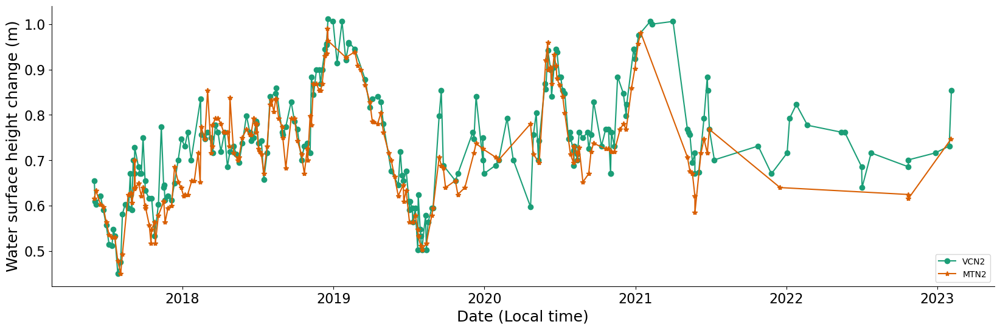

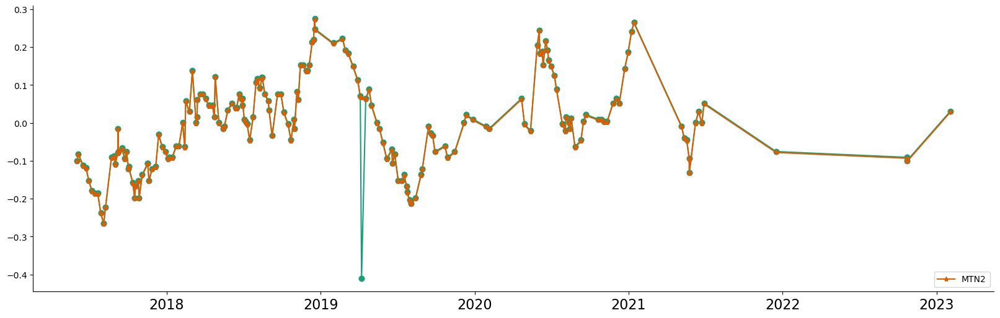

In [23]:
df_MTN2=df_ground_ts.loc[df_ground_ts[st_id_fd]=='MTN2'].copy()
df_VCN2=df_ground_ts.loc[df_ground_ts[st_id_fd]=='VCN2'].copy()


st_id_fd='gauge_id'
st_id='VCN2'
date_fd='decimal_y'
height_fd='height'

fig, ax=plt.subplots(figsize=(20, 6))

df1=df_VCN2
df1=df1.sort_values(by=date_fd)
# plt.plot(df1[date_fd], df1[height_fd]-df1[height_fd].mean(), marker='o', label='VCN2')
plt.plot(df1[date_fd], df1[height_fd], marker='o', label='VCN2', color='#1b9e77')

df2=df_MTN2
df2=df2.sort_values(by=date_fd)
# plt.plot(df2[date_fd], df2[height_fd]-df2[height_fd].mean(), marker='*', label='MTN2')

plt.plot(df2[date_fd], df2[height_fd], marker='*', label='MTN2', color='#d95f02')

ax.set_xlabel('Date (Local time)', fontsize=18)
ax.set_ylabel('Water surface height (m)',fontsize=18)
    
ax.set_yticklabels(ax.get_yticks(),size = 16)
# Make ticks on occurrences of each month:
# ax.xaxis.set_major_locator(mdates.MonthLocator())
# ax.xaxis.set_minor_locator(mdates.MonthLocator())
# Get only the month to show in the x-axis:
# ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

plt.xticks(fontsize=16)
# ax.set_xlim(df1[date_fd].min(), df1[date_fd].max())
# plt.gcf().autofmt_xdate()
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
for pos in ['top', 'right']:
    plt.gca().spines[pos].set_visible(False)

plt.legend(loc='lower right')

plt.figure(figsize=(20, 6))

df1=df_ground_ex
df1=df1.sort_values(by=date_fd)
plt.plot(df1[date_fd], df1[height_fd]-df1[height_fd].mean(), marker='o', color='#1b9e77')
# plt.plot(df1[date_fd], df1[height_fd], marker='o', label='VCN2')
df2=df_MTN2
df2=df2.sort_values(by=date_fd)
plt.plot(df2[date_fd], df2[height_fd]-df2[height_fd].mean(), marker='*', label='MTN2', color='#d95f02')

ax.set_xlabel('Date (Local time)', fontsize=18)
ax.set_ylabel('Water surface height change (m)',fontsize=18)
    
ax.set_yticklabels(ax.get_yticks(),size = 16)
# Make ticks on occurrences of each month:
# ax.xaxis.set_major_locator(mdates.MonthLocator())
# ax.xaxis.set_minor_locator(mdates.MonthLocator())
# Get only the month to show in the x-axis:
# ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

plt.xticks(fontsize=16)
# ax.set_xlim(df1[date_fd].min(), df1[date_fd].max())
# plt.gcf().autofmt_xdate()
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
for pos in ['top', 'right']:
    plt.gca().spines[pos].set_visible(False)


plt.legend(loc='lower right')

print (df1.shape, df2.shape)

(282, 14) (291, 14)
(282, 14) (291, 14)


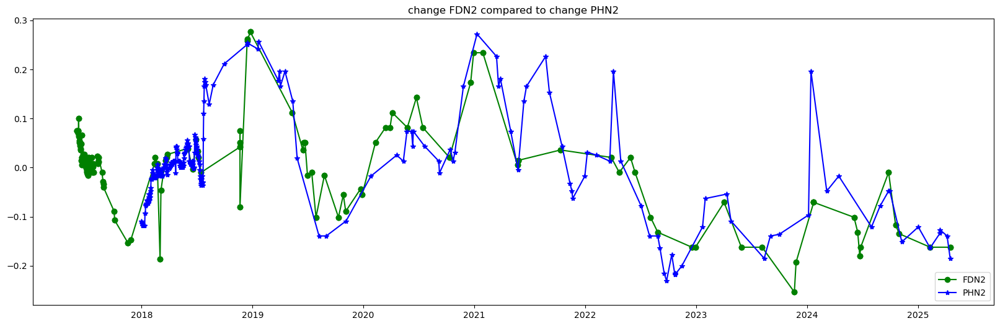

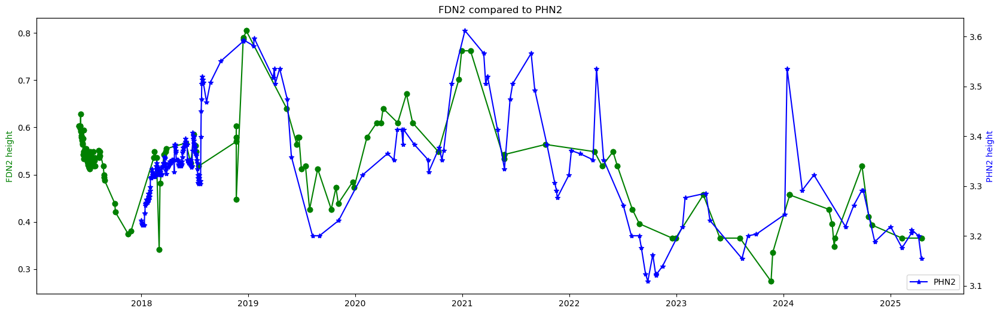

In [24]:
df_PHN2=df_ground_ts.loc[df_ground_ts[st_id_fd]=='PHN2'].copy()

df=df_ground_ts.copy()
st_id_fd='gauge_id'
st_id='FDN2'
date_fd='decimal_y'
height_fd='height'
low_lim=-.4
high_lim=.4

df_ground_ex, df_ground_re,df_diff_to_remove=extract_data_gauge(df, st_id_fd, st_id, date_fd, height_fd, low_lim, high_lim)
df_ground_ex_PH, df_ground_re_PH,df_diff_to_remove_PH=extract_data_gauge(df_PHN2, st_id_fd, 'PHN2', date_fd, height_fd, low_lim, high_lim)

# df_ground_fixed=df_ground_ex.loc[df_ground_ex['date']!='2019-04-07 14:55:00']
# df_ground_ts=df_ground_expd.concat((df_ground_re,df_ground_fixed), axis=0)

#plot goes in here
# df1=df_ground_ex

plt.figure(figsize=(20, 6))

df1=df[df[st_id_fd]==st_id]
df1=df1.sort_values(by=date_fd)
plt.plot(df1[date_fd], df1[height_fd]-df1[height_fd].mean(), 'g-',marker='o', label='FDN2')
df2=df_PHN2
df2=df2.sort_values(by=date_fd)
plt.plot(df2[date_fd], df2[height_fd]-df2[height_fd].mean(),'b-', marker='*', label='PHN2')
plt.title('change '+st_id+' compared to change '+'PHN2')
plt.legend(loc='lower right')
print (df1.shape, df2.shape)

fig, ax=plt.subplots(figsize=(20, 6))

ax2=ax.twinx()
df1=df[df[st_id_fd]==st_id]
df1=df1.sort_values(by=date_fd)
ax.plot(df1[date_fd], df1[height_fd], 'g-', marker='o', label='FDN2')
df2=df_PHN2
df2=df2.sort_values(by=date_fd)
ax2.plot(df2[date_fd], df2[height_fd], 'b-',marker='*', label='PHN2')

ax.set_ylabel('FDN2 height', color='g')
ax2.set_ylabel('PHN2 height', color='b')
plt.title(st_id+' compared to '+'PHN2')
plt.legend(loc='lower right')
print (df1.shape, df2.shape)

### Extract anomalous values stations 12327
#### Reason: There is a extreme value TO-DO: Pending to describe this better

(<Figure size 2000x600 with 1 Axes>, <Figure size 2000x600 with 1 Axes>)

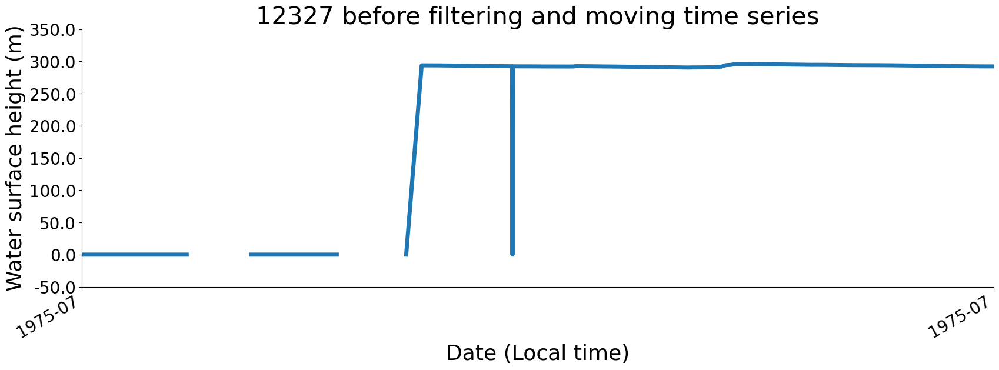

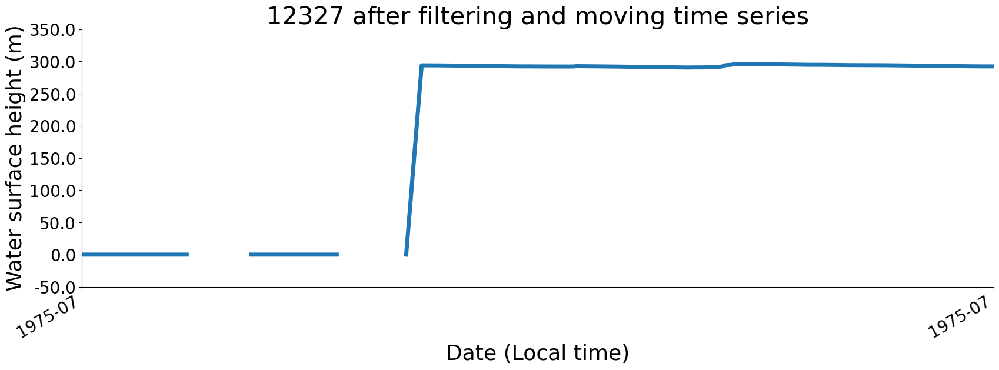

In [25]:
df=df_ground_ts.copy()
st_id='12327'
date_fd='decimal_y'
height_fd='height'
st_id_fd='gauge_id'
low_lim=-5
high_lim=5
df_ground_ex, df_ground_re,df_diff_to_remove=extract_data_gauge(df, st_id_fd, st_id, date_fd, height_fd, low_lim, high_lim)

dates_to_remove=df_diff_to_remove.loc[df_diff_to_remove['diff_time']*365<1, 'date']
df_ground_fixed=df_ground_ex.loc[~df_ground_ex['date'].isin(dates_to_remove)]
df_ground_ts=pd.concat((df_ground_re,df_ground_fixed), axis=0)

#plot goes in here
df1=df_ground_ex

#plot goes in here
title=' filtering and moving time series'
labels={'title':{'label':title, 'size':30},
   'x':{'label':'Date (Local time)', 'font_lbl_s':26, 'tick_s':20,'freq_interval':2},
   'y':{'label':'Water surface height (m)', 'font_lbl_s':26,'tick_s':20 }
   }
plot_ts_preproc(df_ground_ex,df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id], st_id, date_fd, height_fd, labels)


In [28]:
df.loc[df[st_id_fd]==st_id].info()

<class 'pandas.core.frame.DataFrame'>
Index: 1374 entries, 362069 to 363442
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   gauge_id   1374 non-null   object        
 1   source     1374 non-null   object        
 2   decimal_y  1374 non-null   float64       
 3   height     1368 non-null   float64       
 4   date       1374 non-null   datetime64[ns]
 5   year       1374 non-null   int32         
 6   month      1374 non-null   int32         
 7   day        1374 non-null   int32         
 8   hour       1374 non-null   int64         
 9   doy        1374 non-null   int32         
 10  lake_name  1374 non-null   object        
 11  lake_id    1374 non-null   object        
 12  diff       0 non-null      float64       
 13  diff_time  0 non-null      float64       
dtypes: datetime64[ns](1), float64(4), int32(4), int64(1), object(4)
memory usage: 139.5+ KB


### Subset the time series to a period after 2018-04 station 12327
#### Reason: It seems a problem with the reference value at the begginning of the time series

(<Figure size 2000x600 with 1 Axes>, <Figure size 2000x600 with 1 Axes>)

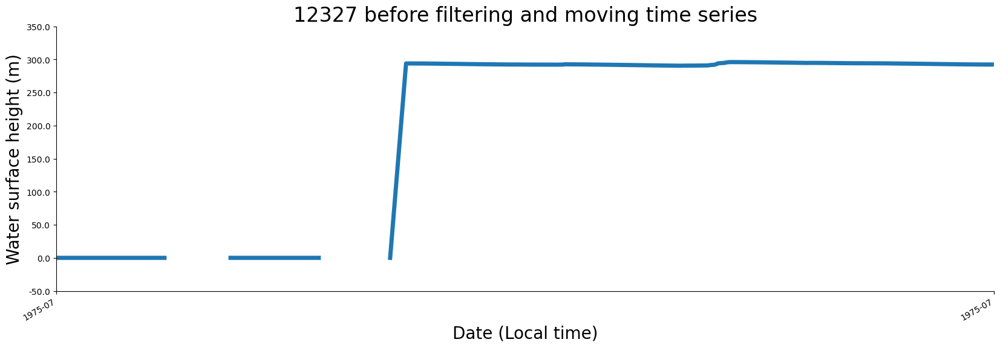

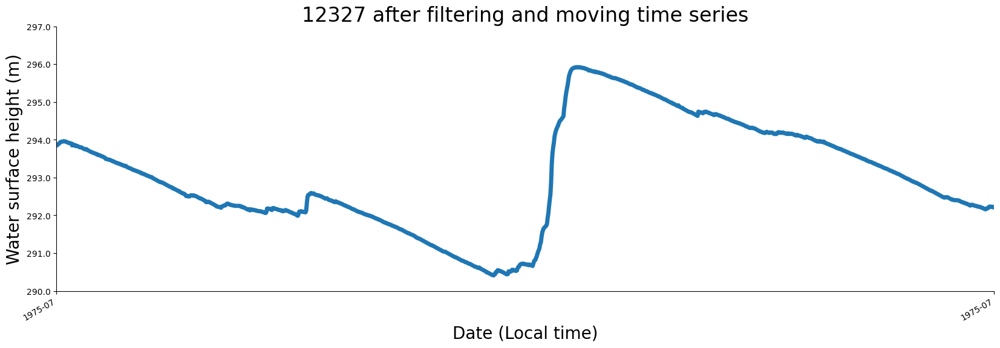

In [29]:
df=df_ground_ts.copy()
st_id='12327'
date_fd='decimal_y'
height_fd='height'
st_id_fd='gauge_id'
df['date']=[x.replace(tzinfo=None) for x in pd.to_datetime(df['date'], utc=True)]
df1=df.loc[df['date']>'2018-04-04'].copy() #This is the date when the big Jump occurs. Therefore the plot will be filtered from here 
df1=df1.sort_values(by=date_fd)

df_ground_ts=pd.concat((df_ground_re,df1), axis=0)


#plot goes in here
title=' filtering and moving time series'
labels={'title':{'label':title, 'size':24},
   'x':{'label':'Date (Local time)', 'font_lbl_s':20, 'tick_s':10,'freq_interval':2},
   'y':{'label':'Water surface height (m)', 'font_lbl_s':20,'tick_s':10 }
   }
plot_ts_preproc(df.loc[df[st_id_fd]==st_id],df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id], st_id, date_fd, height_fd, labels)


In [30]:
df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id]

,gauge_id,source,decimal_y,height,date,year,month,day,hour,doy,lake_name,lake_id,diff,diff_time
362089,12327,RVBR,2018.258904,293.86,2018-04-05,2018,4,5,12,95,AÃ§ude PetrÃ´nio Portela,12327,0.00,0.00274
362090,12327,RVBR,2018.261644,293.85,2018-04-06,2018,4,6,12,96,AÃ§ude PetrÃ´nio Portela,12327,-0.01,0.00274
362091,12327,RVBR,2018.264384,293.88,2018-04-07,2018,4,7,12,97,AÃ§ude PetrÃ´nio Portela,12327,0.03,0.00274
362092,12327,RVBR,2018.267123,293.88,2018-04-08,2018,4,8,12,98,AÃ§ude PetrÃ´nio Portela,12327,0.00,0.00274
362093,12327,RVBR,2018.269863,293.90,2018-04-09,2018,4,9,12,99,AÃ§ude PetrÃ´nio Portela,12327,0.02,0.00274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
363438,12327,RVBR,2021.990411,292.23,2021-12-28,2021,12,28,12,362,AÃ§ude PetrÃ´nio Portela,12327,0.00,0.00274
363439,12327,RVBR,2021.993151,292.22,2021-12-29,2021,12,29,12,363,AÃ§ude PetrÃ´nio Portela,12327,-0.01,0.00274
363440,12327,RVBR,2021.995890,292.22,2021-12-30,2021,12,30,12,364,AÃ§ude PetrÃ´nio Portela,12327,0.00,0.00274
363441,12327,RVBR,2021.998630,292.21,2021-12-31,2021,12,31,12,365,AÃ§ude PetrÃ´nio Portela,12327,-0.01,0.00274


In [31]:
df_ground_ts['date']

0        2002-07-04 00:00:00
1        2002-07-05 00:00:00
2        2002-07-06 00:00:00
3        2002-07-07 00:00:00
4        2002-07-08 00:00:00
                 ...        
330703   2025-04-20 21:46:00
331530   2025-04-22 16:34:36
331531   2025-04-23 21:31:01
331532   2025-04-24 17:05:41
331533   2025-04-27 22:49:43
Name: date, Length: 455886, dtype: datetime64[ns]

### Extract anomalous values station 12056
#### Reason: Differences of up to 8 m in a day

(<Figure size 2000x600 with 1 Axes>, <Figure size 2000x600 with 1 Axes>)

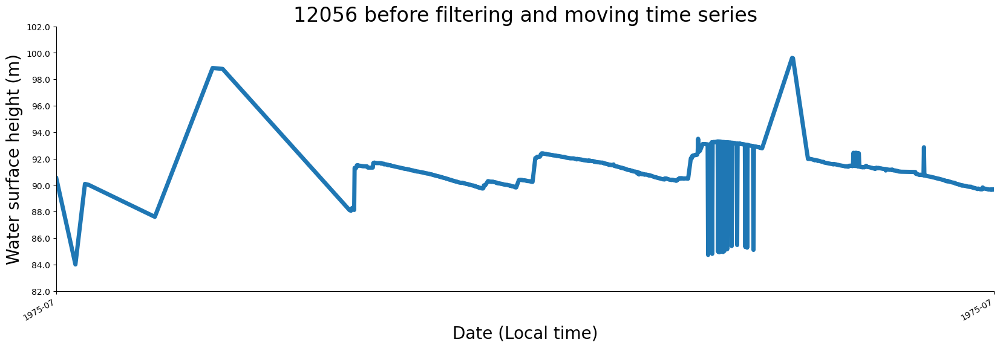

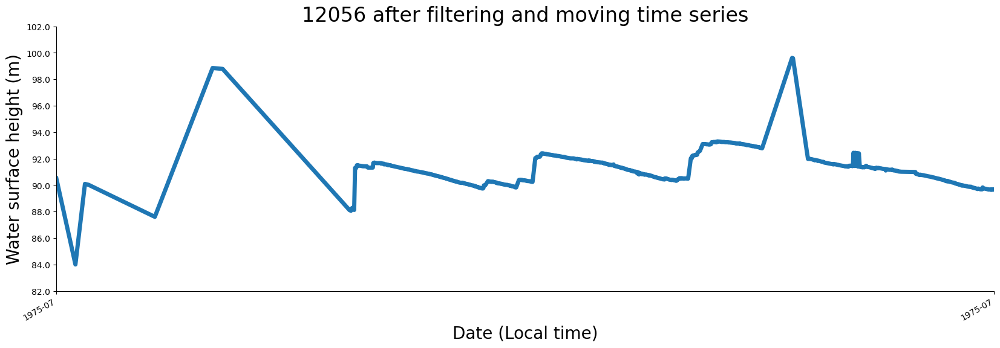

In [32]:
df=df_ground_ts.copy()
st_id='12056'
date_fd='decimal_y'
height_fd='height'
st_id_fd='gauge_id'

low_lim=-1.0
high_lim=1.0
df_ground_ex, df_ground_re,df_diff_to_remove=extract_data_gauge(df, st_id_fd, st_id, date_fd, height_fd, low_lim, high_lim)

#Extract from this gauge those that are with differences more than 8 m in about a day
dates_to_remove=df_diff_to_remove.loc[df_diff_to_remove['diff_time']*365<1, 'date']
df_ground_fixed=df_ground_ex.loc[~df_ground_ex['date'].isin(dates_to_remove)]

#Date to remove 2020-05-07 because it is the only one in the middle of two days in which the change in water elevation was over 8.0 m
df_ground_fixed=df_ground_fixed.loc[df_ground_fixed['date']!='2020-05-07']

# df_ground_ts=pd.concat((df_ground_re,df_ground_fixed), axis=0)

#plot goes in here
title=' filtering and moving time series'
labels={'title':{'label':title, 'size':24},
   'x':{'label':'Date (Local time)', 'font_lbl_s':20, 'tick_s':10,'freq_interval':2},
   'y':{'label':'Water surface height (m)', 'font_lbl_s':20,'tick_s':10 }
       }    
# plot_ts_preproc(df.loc[df[st_id_fd]==st_id],df_ground_ts.loc[df_ground_ts[st_id_fd]==st_id], st_id, date_fd, height_fd, labels)
plot_ts_preproc(df.loc[df[st_id_fd]==st_id],df_ground_fixed.loc[df_ground_fixed[st_id_fd]==st_id], st_id, date_fd, height_fd, labels)


In [33]:
df_ground_fixed.loc[df_ground_fixed['diff'].abs()>.7]

,gauge_id,source,decimal_y,height,date,year,month,day,hour,doy,lake_name,lake_id,diff,diff_time
363444,12056,RVBR,2016.471311,84.00,2016-06-21,2016,6,21,12,173,AÃ§ude Boa Vista,12056,-6.50,0.114754
363445,12056,RVBR,2016.528689,90.09,2016-07-12,2016,7,12,12,194,AÃ§ude Boa Vista,12056,6.09,0.057377
363447,12056,RVBR,2016.949454,87.60,2016-12-13,2016,12,13,12,348,AÃ§ude Boa Vista,12056,-2.42,0.398907
363448,12056,RVBR,2017.297260,98.85,2017-04-19,2017,4,19,12,109,AÃ§ude Boa Vista,12056,11.25,0.347807
363450,12056,RVBR,2018.121918,88.10,2018-02-14,2018,2,14,12,45,AÃ§ude Boa Vista,12056,-10.68,0.764384
363795,12056,RVBR,2019.239726,92.04,2019-03-29,2019,3,29,12,88,AÃ§ude Boa Vista,12056,1.80,0.016438
364108,12056,RVBR,2020.176230,92.03,2020-03-05,2020,3,5,12,65,AÃ§ude Boa Vista,12056,1.54,0.016393
364258,12056,RVBR,2020.785519,99.61,2020-10-14,2020,10,14,12,288,AÃ§ude Boa Vista,12056,6.83,0.180328
364260,12056,RVBR,2020.881148,91.98,2020-11-18,2020,11,18,12,323,AÃ§ude Boa Vista,12056,-7.61,0.090164
364343,12056,RVBR,2021.154795,92.44,2021-02-26,2021,2,26,12,57,AÃ§ude Boa Vista,12056,0.99,0.002740


# 4. Save dataframe will all the time series preprocessed 

In [34]:
time_file=datetime.now().strftime("%Y%m%d_%H_%M")
# df_ground_ts.to_csv('../data/results/data_preprocessed.csv', sep=',')
#Backup
df_ground_ts.to_csv('../data/results/data_preprocessed_'+time_file+'r2025.csv', sep=',')

In [35]:
time_file

'20250428_22_01'

In [59]:
#Only if data has been generated
#pd.read_csv('../data/results/data_preprocessed_20230503_12_13.csv', sep=',', low_memory=False, parse_dates=['date'])
df_ground_ts=pd.read_csv('../data/results/data_preprocessed_20250428_22_01r2025.csv', sep=',', low_memory=False, parse_dates=['date'])
df_ground_ts['date']=[x.replace(tzinfo=None) for x in pd.to_datetime(df_ground_ts['date'], utc=True, format='mixed')]
#Read all the gauges with time series to process. This file contain the lake ids that will be used in the computated. It is used to filter the shapefile dataframe
path= '../data/alti_timeseries/lonlat_vs_altis_ed_r2025.csv'


if platform.system()=='Linux':
    altis_csv=pd.read_csv(path, sep=',',encoding='iso-8859-1')
else:
    altis_csv=pd.read_csv(path, sep=',', encoding='windows-1252')  

#Get all lakes 
path_lakes='../data/shapes/all_lakes_paper.shp'#wgs84_f.shp'

df_sel_lakes=gpd.read_file(path_lakes)

df_ground_ts.info()
# import icecream as ic


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455886 entries, 0 to 455885
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Unnamed: 0  455886 non-null  int64         
 1   gauge_id    455886 non-null  object        
 2   source      455886 non-null  object        
 3   decimal_y   455886 non-null  float64       
 4   height      455278 non-null  float64       
 5   date        455886 non-null  datetime64[ns]
 6   year        455886 non-null  int64         
 7   month       455886 non-null  int64         
 8   day         455886 non-null  int64         
 9   hour        455886 non-null  int64         
 10  doy         455886 non-null  int64         
 11  lake_name   205086 non-null  object        
 12  lake_id     205086 non-null  float64       
 13  diff        4550 non-null    float64       
 14  diff_time   4550 non-null    float64       
dtypes: datetime64[ns](1), float64(5), int64(6), object(

In [60]:
import gc

gc.collect()

0

In [61]:
gauges=df_ground_ts['gauge_id'].unique()
df_ground_ts_temp=pd.DataFrame()
print(df_ground_ts.shape, 'Size with duplicates')
for st in gauges:
    df=df_ground_ts.loc[(df_ground_ts['gauge_id']==st)].copy()#df_ground_ts[df_ground_ts.duplicated(['height','date'])])]
    No=df[df.duplicated()].shape[0]
    print('Gauge '+st,[No, df.shape[0]])
    df=df.drop_duplicates(keep='first')
    df_ground_ts_temp=pd.concat((df_ground_ts_temp, df), axis=0)
    del df
print(df_ground_ts_temp.shape, 'Size without duplicates')


(455886, 15) Size with duplicates
Gauge 2464800 [1366, 8426]
Gauge 6903880 [1367, 9088]
Gauge 6604000 [1324, 9216]
Gauge 1824 [1399, 9436]
Gauge 2830 [28096, 75798]
Gauge 1830 [15181, 118124]
Gauge 2832 [1752, 6465]
Gauge 2028 [1186, 32187]
Gauge 2231 [1246, 27042]
Gauge 2234 [1246, 27830]
Gauge 2300 [1246, 21521]
Gauge 2316 [23518, 62503]
Gauge RLH2 [84, 168]
Gauge FDN2 [130, 412]
Gauge MAB2 [484, 968]
Gauge BTN2 [422, 1014]
Gauge SPA2 [175, 350]
Gauge HMT2 [118, 236]
Gauge MCW2 [28, 56]
Gauge PHN2 [203, 494]
Gauge CQK2 [32, 64]
Gauge WEW2 [361, 722]
Gauge CFN2 [25, 67]
Gauge SAW2 [794, 1588]
Gauge QUL2 [157, 314]
Gauge SLL2 [112, 224]
Gauge BLB2 [48, 96]
Gauge SKT2 [49, 98]
Gauge VCN2 [168, 388]
Gauge YSL2 [226, 452]
Gauge MRP2 [11, 22]
Gauge PAW2 [50, 100]
Gauge 19069 [1462, 9593]
Gauge 19060 [1463, 9595]
Gauge 19126 [1464, 9597]
Gauge 12030 [1365, 3584]
Gauge 12036 [240, 1176]
Gauge 12056 [1135, 2317]
Gauge KHB2 [403, 806]
Gauge TAB2 [872, 1744]
Gauge MTN2 [274, 652]
Gauge 12327 [0

In [62]:
import gc
df_ground_ts=df_ground_ts_temp.copy()
# del df_ground_ts_temp
gc.collect()

0

### Safe final dataset

In [40]:
time_file=datetime.now().strftime("%Y%m%d_%H_%M")
# df_ground_ts.to_csv('../data/results/data_preprocessed.csv', sep=',')
#Backup
df_ground_ts.to_csv('../data/results/data_preprocessed_'+time_file+'r2025.csv', sep=',')
time_file

'20250428_22_03'

# 5. Preprocess altis data of the selected lakes 

In [63]:
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)


#Read each file and convert it to dataframe
g_path='../data/alti_timeseries/'

time_fig=datetime.now().strftime("%Y%m%d_%H_%M")

df_final_altis=pd.DataFrame()
df_final_ground=pd.DataFrame()
    

tf=TimezoneFinder()

#Filter to lakes approved
#---------------------------
# approve_locss=df_sel_lakes.loc[df_sel_lakes['AprovedFor']==1]['gauge_id'].values #['HMT2','PHN2','SAW2','BTN2','QUL2', 'WEW2', 'CFN2','YSL2','SLL2','TAB2','KHB2']

#HURRY Parch code so it works with the new gauges at the two lakes that have two gauges
# Fix, modify the shapefile so it can get the coordinates of the two gauges


# altis_csv=altis_csv.loc[altis_csv['station_id'].isin(approve_locss)]

lon_fd='lon'
lat_fd='lat'

df_gts=df_ground_ts.copy()

st_fd='gauge_id'
st_date_fd='date'
altis_date_fd = 'date'  # Same value for Sentinel-3A/B
altis_height_fd = 'ice1_ku_SurfHeight_alti_median'  # Same value for Sentinel-3A/B
n_obs_altis='number of sample' #Number of observations
nodataalti=-9999

wse_ref='e'
i=1

#################CHANGE WITH N COMPARISON ####################
#----ALL
this_source='ALL'

#----ARHN
# this_source='ARHN'

##---LOCSS
# this_source='LOCSS'

#---USGS
# this_source='USGS'

##----RVBR
# this_source='RVBR'

#-----ICECV

# this_source='ICECV'
###########################################################

if this_source not in ['ALL', 'ICECV']:
    altis_csv=altis_csv.loc[altis_csv['source']==this_source].copy()

data_source=this_source

altis_csv['tz']=altis_csv.apply(lambda x:tf.timezone_at(lng=x[lon_fd],lat=x[lat_fd]), axis=1)
#filter only altis time series with ground observations
altis_w_gts_csv=altis_csv.loc[altis_csv['lake_id'].notna()]

altis_w_gts_csv=altis_w_gts_csv.sort_values(by='source')

for index,row in altis_w_gts_csv.iterrows():
    # print(row['station_id'])
    altis_name=row['altivs_nam']
    st_id=row['station_id']
    ncolgeoid=row['ncolgeoid']
    lake_id=str(int(row['lake_id']))
    orbit_nu=int(row['orbit'])
    # Call every altis relative to the ellipsoide
    #median ocog_surfheight_ku
    
    # is_Sentinel=altis_name.find('Sentinel-3')
    # if is_Sentinel!=-1:
    if ncolgeoid!='No':
        #Call the function with geoid field and wse_type='e'
        altis_height_fd = 'ice1_ku_SurfHeight_alti_median'  # Same value for Sentinel-3A/B
        df_altis, df_ground_st=open_match_station_altis(g_path,altis_name, st_fd, df_gts, st_id,altis_date_fd, altis_height_fd,n_obs_altis,
                                                        nodataalti,ncolgeoid=ncolgeoid,wse_ref=wse_ref)
    else:
        #Call the function with geoid field and wse_type='g'
        #Parsing for the new dataset. During review
        altis_height_fd='median ocog_surfheight_ku'
        df_altis, df_ground_st=open_match_station_altis(g_path,altis_name, st_fd, df_gts, st_id,altis_date_fd, altis_height_fd,n_obs_altis, nodataalti)
    
    print('Station '+row['tz']+' ncolgeoid: '+str(ncolgeoid).upper(), 'Gauge ID: '+st_id+' ground_st: '+str(not df_ground_st.empty)+' df_altis: '+str(df_altis.shape)+' Lake ID: '+lake_id)
    
    # print(df_altis.columns)
    if not df_ground_st.empty:
        # print('df_altis\n', df_altis.head(3))
        # print('df_ground_st '+st_id+'\n', df_ground_st.head(3))
        df_altis['ground_st_1']=st_id
        lake_name=df_ground_st['lake_name'].iloc[0]
        #Convert time in df_gts_st to UTC
        source=df_ground_st['source'].iloc[0]
        df_ground_st[st_date_fd]=pd.to_datetime(df_ground_st[st_date_fd])
        df_ground_st['date_utc']=[timezone(row['tz']).localize(date).astimezone(utc.zone) for date in df_ground_st[st_date_fd]]
        
        #print('\nBefore: '+st_id+'\n', df_ground_st[[st_date_fd,'date_utc','decimal_y']].head())
        df_ground_st['altis_d_1']=altis_name
        df_ground_st['orbit']=orbit_nu
        #Get the dates of altis
        # ic(df_altis[altis_date_fd].dt.normalize().max())
        (df_altis_c, df_ground_c)=get_common_period(df_ts1=df_altis, df_ts2=df_ground_st, 
                                                    date_ts1_fd=altis_date_fd, date_ts2_fd='date_utc', delta_days=True, ndays=10)

#       
        if not df_altis_c.empty:
            if source=='USGS':
                df_ground_c=get_date_time_cols(df_ground_c, 'date_utc', has_hour=False)
            else:
                df_ground_c=get_date_time_cols(df_ground_c, 'date_utc', has_hour=True)
            #print('\nAfter: '+st_id+'\n', df_ground_st[[st_date_fd,'date_utc','decimal_y']].head())
            df_ground_c=df_ground_c.sort_values(by=['decimal_y'])
            df_altis_c=df_altis_c.sort_values(by=['decimal_y'])
            # print(df_altis_c.head())
            delta=5
            for delta in range (1,11):
                median_fd='median_d_'+str(delta)
                mean_fd='mean_d_'+str(delta)
                std_fd='std_d_'+str(delta)
                mad_fd='mad_d_'+str(delta) #Median absolute deviation
                count_fd='count_d_'+str(delta)
                criteria_fd='type_m_d_'+str(delta)
            
    
                # Get moving windows
                df_altis_c[[median_fd,mad_fd, mean_fd, std_fd,count_fd, criteria_fd]]=df_altis_c.apply(lambda x: moving_window_around_date(df_ground_c,
                                                                                                                  x[altis_date_fd],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  'date_utc'), axis=1).apply(pd.Series)
                # Interpolate in moving windows                                                                            
                median_fd='val_w_int_d_'+str(delta)
                mean_fd='mean_w_int_d_'+str(delta)
                std_fd='std_w_int_d_'+str(delta)
                mad_fd='mad_w_int_d_'+str(delta) #Median absolute deviation
                count_fd='count_w_int_d_'+str(delta)
                criteria_fd='type_w_int_d_'+str(delta)
            
    
                # Get interpolate in moving windows
                df_altis_c[[median_fd,mad_fd, mean_fd, std_fd,count_fd, criteria_fd]]=df_altis_c.apply(lambda x: moving_window_around_date(df_ground_c,
                                                                                                                  x[altis_date_fd],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  'date_utc',
                                                                                                                   'linear'), axis=1).apply(pd.Series)
                
                #second approach, the closest date
                #delta=5
                val_cd_fd='val_cd_d_'+str(delta)
                criteria_fd='type_cd_d_'+str(delta)
                closer_dt_fd='ndays_cd_d_'+str(delta)
                mea_cd_fd='mea_cd_d_'+str(delta)
                std_cd_fd='std_cd_d_'+str(delta)
                mad_cd_fd='mad_cd_d_'+str(delta) #Median absolute deviation
                n_cd_fd='n_cd_d_'+str(delta)
                n_days_cd_fd='n_days_cd_d_'+str(delta)
                # Get closer value around a date if more than one median
                df_altis_c[[val_cd_fd,criteria_fd,closer_dt_fd,mea_cd_fd, mad_cd_fd, std_cd_fd,n_cd_fd,n_days_cd_fd]]=df_altis_c.apply(lambda x: closer_value_around_date(df_ground_c,
                                                                                                                  x[altis_date_fd],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  'date_utc'), axis=1).apply(pd.Series)
                
                val_cd_fd='val_int_d_'+str(delta)
                criteria_fd='type_int_d_'+str(delta)
                closer_dt_fd='ndays_int_d_'+str(delta)
                mea_cd_fd='mea_int_d_'+str(delta)
                std_cd_fd='std_int_d_'+str(delta)
                mad_cd_fd='mad_int_d_'+str(delta) #Median absolute deviation
                n_cd_fd='n_int_d_'+str(delta)
                n_days_cd_fd='n_days_int_d_'+str(delta)
                # Get closer value around a date if more than one, linearly interpolate
                df_altis_c[[val_cd_fd,criteria_fd,closer_dt_fd,mea_cd_fd, mad_cd_fd, std_cd_fd,n_cd_fd,n_days_cd_fd]]=df_altis_c.apply(lambda x: closer_value_around_date(df_ground_c,
                                                                                                                  x[altis_date_fd],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  'date_utc', 
                                                                                                                  'linear'), axis=1).apply(pd.Series)
                
                
            #Get interpolated data 
            datast1_2_ts2dy, corr_ts1ts2, ns_ts2, rmsd_ts2, ampl_ts1=interp_ts12ts2_stat(df_ground_c['decimal_y'].to_numpy(), df_ground_c['height'].to_numpy(), 
                                            df_altis_c['decimal_y'].to_numpy(), df_altis_c['height'].to_numpy())
            
            df_altis_c['int_height']=pd.Series(datast1_2_ts2dy)
            df_altis_c['int_corr_ts1ts2']=corr_ts1ts2
            df_altis_c['int_rmsd_ts2']=rmsd_ts2
            #add columns
            df_altis_c['lake_name']=lake_name
            df_altis_c['source']=df_ground_c['source'].iloc[0]
            df_altis_c['lake_id']=lake_id
            df_altis_c['orbit']=orbit_nu
            df_final_altis=pd.concat((df_final_altis,df_altis_c), axis=0)
            df_final_ground=pd.concat((df_final_ground,df_ground_c), axis=0)
        
    

df_final_ground=df_final_ground.rename(columns={'altis_d_1':'name_altis'}, errors='raise')
df_final_altis=df_final_altis.rename(columns={'ground_st_1':'gauge_id'}, errors='raise')



Station America/Argentina/Salta ncolgeoid: GEOID_01_MEDIAN Gauge ID: 1824 ground_st: True df_altis: (73, 9) Lake ID: 6610142963
Station America/Argentina/Salta ncolgeoid: GEOID_EIGEN6C4D_MEDIAN Gauge ID: 2028 ground_st: True df_altis: (104, 9) Lake ID: 6620000613
Station America/Argentina/Salta ncolgeoid: GEOID_MEDIAN Gauge ID: 2028 ground_st: True df_altis: (157, 9) Lake ID: 6620000613
Station America/Argentina/Salta ncolgeoid: GEOID_01_MEDIAN Gauge ID: 2028 ground_st: True df_altis: (77, 9) Lake ID: 6620000613
Station America/Argentina/Catamarca ncolgeoid: GEOID_01_MEDIAN Gauge ID: 2234 ground_st: True df_altis: (76, 9) Lake ID: 6610149612
Station America/Argentina/Catamarca ncolgeoid: GEOID_01_MEDIAN Gauge ID: 2234 ground_st: True df_altis: (75, 9) Lake ID: 6610149612
Station America/Argentina/Catamarca ncolgeoid: GEOID_01_MEDIAN Gauge ID: 2316 ground_st: True df_altis: (41, 9) Lake ID: 6530064712
Station America/Edmonton ncolgeoid: GEOID_01_MEDIAN Gauge ID: HMT2 ground_st: True df_

In [64]:
help(closer_value_around_date)

Help on function closer_value_around_date in module ts_preprocesing:

closer_value_around_date(df, date, delta, v_fd, d_fd, method='median')
    Moving window of a value around a date (targeting date) +- n days defined by delta
    Inputs:
        df: Dataframe containing the dates and values
        date: date around the one the closer value will be estimated
        v_fd: name of the value column in df
        d_fd: name of the date column in df
        method: method implemented when more than one value is closer to the date. Default median. Options: 'linear' for linear interpolation
                scipy.interpolate.griddata is used to do the linear interpolation
    Output:
        val_cd: value obtained from the analysis
        type_cd: 'closed', if only one date was the closest, 'median': if more than two dates where equally closed
        ndays_cd: amount of days between the targe date and the closest date
        n_cd: number of data used to calculate value
        mea_cd: me

In [57]:
(np.datetime64('2009-01-01 10:00') - np.datetime64('2009-01-01 12:00'))/np.timedelta64(1,'D')

-0.08333333333333333

In [65]:
# print(*df_final_altis.columns)
df_final_altis=df_final_altis.rename(columns={'ground_st_1':'gauge_id'})

In [66]:
gc.collect()

605

In [67]:
df_final_altis.gauge_id.unique()

array(['1824', '2028', '2234', '2316', 'HMT2', 'KHB2', 'MAB2', 'MCW2',
       'MRP2', 'MTN2', 'PAW2', 'PHN2', 'RLH2', 'SAW2', 'FDN2', 'SLL2',
       'SPA2', 'TAB2', 'VCN2', 'QUL2', 'BTN2', 'CFN2', 'YSL2', 'WEW2',
       'BLB2', '12056', '12030', '12036', '19060', '19069', '19126',
       '12327', '2464800', '6604000', '6903880'], dtype=object)

In [68]:
#Parching FDN2 and VCN2
df_final_altis.loc[df_final_altis['gauge_id']=='FDN2', 'lake_name']= 'Lake Phelps West' #df_final_altis.loc[df_final_altis['gauge_id']=='PHN2', 'lake_name'].iloc[0]
df_final_altis.loc[df_final_altis['gauge_id']=='PHN2', 'lake_name']= df_final_altis.loc[df_final_altis['gauge_id']=='FDN2', 'lake_name'].iloc[0][:4]+ ' East'
# df_final_altis.loc[df_final_altis['gauge_id']=='PHN2', 'lake_name']
df_final_altis.loc[df_final_altis['gauge_id']=='VCN2', 'lake_name']= df_final_altis.loc[df_final_altis['gauge_id']=='MTN2', 'lake_name'].iloc[0][:-4]+'East'
df_final_altis.loc[df_final_altis['gauge_id']=='MAB2', 'lake_name']='Matian Haor' #Althought this lake is not included given deliation
# df_final_altis.loc[df_final_altis['gauge_id']=='VCN2', 'lake_name']

In [69]:
df_final_altis.loc[df_final_altis['lake_name'].isna(), 'gauge_id'].unique()#=='MTN2', 'lake_name'].iloc[0]

array([], dtype=object)

### Mark only the lakes that will be in the paper

In [70]:
#Add a mark to only places that have been selected for evaluation
gauges_to_process=df_sel_lakes.loc[df_sel_lakes.ol_Aproved==1, 'gauge_id']
f=[gauges_to_process.copy(),pd.Series(['VCN2', 'FDN2'], name='gauge_id')]

approve_paper =pd.concat(f, axis=0)

df_final_altis['for_paper']=None
df_final_ground['for_paper']=None
df_final_altis.loc[df_final_altis['gauge_id'].isin(approve_paper), 'for_paper']='Y'
df_final_ground.loc[df_final_ground['gauge_id'].isin(approve_paper),'for_paper']='Y'

In [71]:
approve_paper 

0       19060
1       19069
2       19126
3       12030
4       12036
5       12056
6       12327
7        BLB2
8        1824
9        2028
10       2234
11       2316
12    2464800
13       BTN2
14       CFN2
15       HMT2
16       KHB2
17       PHN2
18       QUL2
20       SAW2
21       SLL2
22       TAB2
23       WEW2
24       YSL2
30       MTN2
71    6903880
72    6604000
0        VCN2
1        FDN2
Name: gauge_id, dtype: object

## 5.1 Plot the influence on the number of matchups based in the method used

In [72]:
df_final_altis.to_csv('../data/results/matchups_several_methods_r2025.csv')

In [73]:
# fig, axes = plt.subplots(10, 3, figsize=(10, 400), sharey=True)
# df=df_final_altis.loc[df_final_altis['for_paper']=='Y'].copy()
# df['orbit_lake_source']=[x.split('-')[1] for x in df[names_field]]
# df['orbit_lake_source']=df['orbit_lake_source']+'__'+df['lake_name']+'__'+df['source']
# df.sort_values(by=['source'], inplace=True, ascending=True)
import plotly.graph_objects as go
from plotly.subplots import make_subplots
rw=8
cl=5

name_matches=['match_cd_'+str(x) for x in range(1,11)]
days_matches=['n_cd_d_'+str(x) for x in range(1,11)]
name_field='orbit_lake_source'
df=df_count_matches[[name_field]+name_matches+days_matches].copy()
df
val_days=str(1)




df_count_obs_cd_final=pd.DataFrame()
for match_oa in name_matches:
    df_plot=df.melt(id_vars=[name_field])
    df_count_obs_cd=df_plot.loc[df_plot['variable']==match_oa].groupby([name_field,'variable']).count().reset_index()
    df_count_obs_cd['n_days']=int(match_oa.split('_')[2])
    df_count_obs_cd_final=pd.concat((df_count_obs_cd_final, df_count_obs_cd), axis=0)
    
    # fig.add_trace(x=df_count_obs_cd[]
c=r=1



df_count_obs_cd_final['source']=[x.split('_')[len(x.split('_'))-1] for x in df_count_obs_cd_final[name_field]]
df_count_obs_cd_final=df_count_obs_cd_final.sort_values('source')
matches=df_count_obs_cd_final[name_field].unique()
matchess=[x.split('_')[len(x.split('_'))-3]+'\n'+x.split('_')[len(x.split('_'))-1] for x in matches]

fig= make_subplots(rows=rw, cols=cl, subplot_titles=matchess)
for nm in matches:
    df_plot=df_count_obs_cd_final.loc[df_count_obs_cd_final[name_field]==nm]
    df_plot=df_plot.sort_values('n_days')
    fig.add_trace(go.Scatter(x=df_plot['n_days'], y=df_plot['value'],
                            marker=dict(size=4,color='#54278f'), showlegend=False), row=r, col=c)
    if c==cl:
        
        c=1
        r=r+1
        
    else:
        c=c+1
    
fig.update_layout(width=1300, height=1500, template='simple_white',xaxis2=dict(range=[1,10]))                                                
fig.show()


NameError: name 'df_count_matches' is not defined

# 6. Generate the matching time series of ground and altimeter observations

In [76]:
time_fig=datetime.now().strftime("%Y%m%d_%H_%M")
df_final_ground.to_csv('../data/results/preprossed_ground_data_'+time_fig+'r2025.csv', sep=',')
df_final_altis.to_csv('../data/results/preprossed_altis_data_'+time_fig+'r2025.csv', sep=',')

In [77]:
time_fig

'20250428_22_44'

# 7. Generate the matching time series of ground and altimeter observations in SAR mode

In [3]:
## Have ready the ground observations from df_ground_ts in 5 (After duplicates are removed)
#Only if data has been generated

#Time from last cell in 4. 
time_file='20231019_11_15'
df_ground_ts=pd.read_csv('../data/results/data_preprocessed_'+time_file+'.csv', sep=',', low_memory=False, parse_dates=['date'])

In [4]:
#Read observations from SAR procesing mode 

#Original altimeter
path_to_alt='../data/Nielsen_et_al/tmb_lakes/'

#Modeled reconstructed time series
path_to_ts="../data/Nielsen_et_al/ts_lakes/"

# Lake shapefile
path_lakes='../data/shapes/all_lakes_paper.shp'#wgs84_f.shp'
df_sel_lakes=gpd.read_file(path_lakes, encoding='utf-8')

In [85]:
gc.collect()

1401

###  Read data from Karinas results SAR mode original nadir altimeter observations

In [5]:
df_files=pd.DataFrame()
sep=' '

for folder in os.listdir(path_to_alt):
        path=path_to_alt+folder+'/'
        files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))&(f.endswith('ocog.dat'))]
        for f in files:
            f_name=path+f
            df_file=pd.read_csv(f_name, sep=sep)
            df_file['sat']=f[:3]
            df_file['orbit']=f[4:7]
            df_file['lake_id']=folder
            df_files=pd.concat([df_files, df_file], axis=0)
df_files=pd.merge(df_files,df_sel_lakes, on='lake_id', how='inner') 
list_lakes=df_files['lake_id'].unique()
list_lakes

array(['19069', '7320414542', '4530720592', '12030', '1052515', '12327',
       '7320415112', '12036', '6610149612', '7421066862', '7830177462',
       '7320428982', '7320417422', '21', '6530064712', '7320103213',
       '19060', '6610142963', '19126', '7820034152', '22', '12056',
       '1052865', '865120', '6620000613'], dtype=object)

In [6]:
#separate some of the time series
#Create a column time series in the satellite orbit and time (sot)

df_files['ts_sot']=df_files['lake_id']+'_'+df_files['sat']+'_'+df_files['orbit']+'_1'



In [7]:
df_files_temp=df_files.loc[(df_files['lake_name'].str.contains('Machadinho'))&(df_files['time']>=2020.723)].copy()
df_files_temp['ts_sot'].unique()
df_files_temp['ts_sot']=[x[:-1]+'2' for x in  df_files_temp['ts_sot']]
df_files=pd.concat([df_files, df_files_temp], axis=0) #

In [8]:
#For each lake get the ground observation
# df_ground_ts.to_csv('../data/results/prep_temp.csv')

df_ground_ts.loc[df_ground_ts['gauge_id']=='MAB2','lake_id']=22
df_ground_ts.loc[df_ground_ts['gauge_id']=='PHN2','lake_id']=df_ground_ts.loc[df_ground_ts['gauge_id']=='FDN2','lake_id'].unique()[0]
df_ground_ts.loc[df_ground_ts['gauge_id']=='VCN2','lake_id']=df_ground_ts.loc[df_ground_ts['gauge_id']=='MTN2','lake_id'].unique()[0]

#Parching FDN2 and VCN2
df_ground_ts.loc[df_ground_ts['gauge_id']=='FDN2', 'lake_name']= 'Lake Phelps West' #df_final_altis.loc[df_final_altis['gauge_id']=='PHN2', 'lake_name'].iloc[0]
df_ground_ts.loc[df_ground_ts['gauge_id']=='PHN2', 'lake_name']= df_ground_ts.loc[df_ground_ts['gauge_id']=='FDN2', 'lake_name'].iloc[0][:-4]+ ' East'
# df_final_altis.loc[df_final_altis['gauge_id']=='PHN2', 'lake_name']
df_ground_ts.loc[df_ground_ts['gauge_id']=='VCN2', 'lake_name']= df_ground_ts.loc[df_ground_ts['gauge_id']=='MTN2', 'lake_name'].iloc[0][:-4]+'East'
df_ground_ts.loc[df_ground_ts['gauge_id']=='MAB2', 'lake_name']='Matian Haor' #Althought this lake is not included given deliation

#TO-DO: Copy the lake_ids before generating the df_ground_ts file in Item #6
df_ground_SAR=df_ground_ts.loc[(~df_ground_ts['lake_id'].isna())|(df_ground_ts['lake_id']=='')]
lakes_ground_obs=df_ground_SAR['lake_id'].unique()

#MAB2 lake_id is 22
#PHN2 lake_id is 7320414542
#VCN2 lake_id is 7320415112

lakes_ground_obs=lakes_ground_obs.astype(int).astype(str)

## Extract outliers from SAR



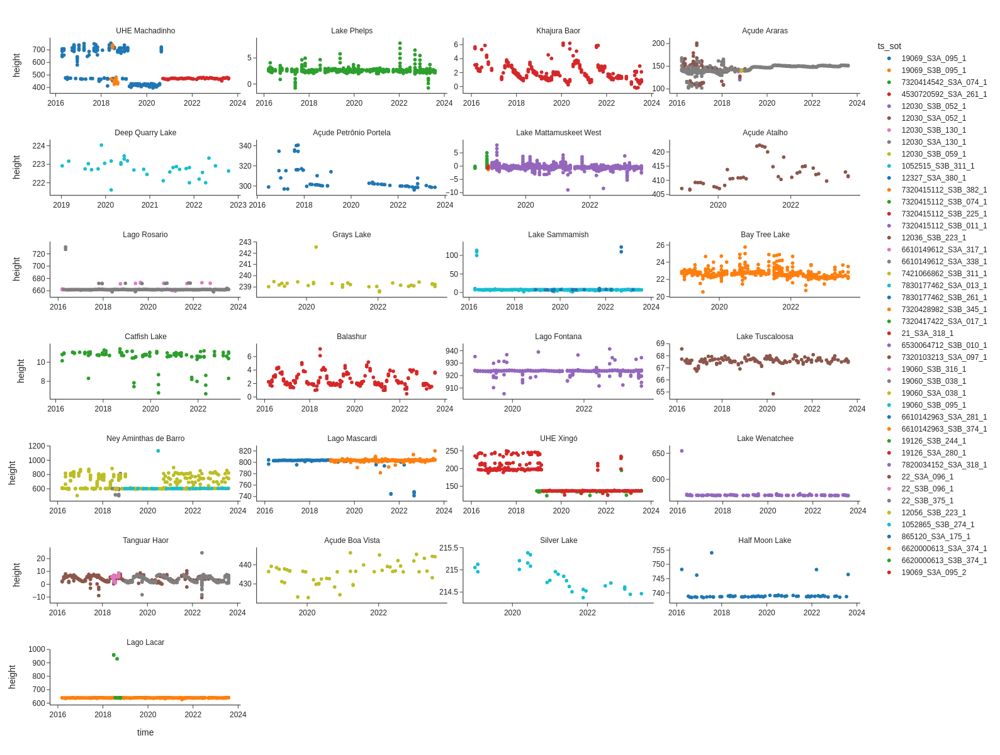

In [9]:
#Plot to exclude outliers
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go


df=df_files
x_fd='time'
y_fd='height'
facet='lake_name'
color='ts_sot'
fig = px.scatter(df, x=x_fd, y=y_fd, 
                 facet_col=facet,color=color,facet_col_wrap=4,
                 # color_discrete_sequence=["#7570b3","#d95f02"],
                 template="simple_white", width=1200, height=1200)
# fig.update_traces(marker=dict(size=5,color='#661666'))
fig.update_xaxes(matches=None)
fig.update_yaxes(matches=None)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.for_each_yaxis(lambda y: y.update(showticklabels=True,matches=None))
fig.for_each_xaxis(lambda x: x.update(showticklabels=True,matches=None))

fig.show()
del df

### Extract from selected lakes prevoiusly observed

In [10]:
sel_lakes_filtered=[{
    'id':'12030',
    'name':'Açude Araras',
    'min':130,
    'max':155
    },
   {
    'id':'6610149612',
    'name':'Lago Rosario',
    'min':660,
    'max':664
   },
   {
    'id':'12056',
    'name':'Açude Boa Vista',
    'min':None,
    'max':None
   },
   {
    'id':'19060',
    'name':'Ney Aminthas de Barro',
    'min':600,
    'max':610
   },
    {
    'id':'21',
    'name':'Balashur',
    'min':None,
    'max':None
   },
    {
    'id':'7421066862',
    'name':'Grays Lake',
    'min':None,
    'max':242
   },
    {
    'id':'4530720592',
    'name':'Khajura Baor',
    'min':None,
    'max':None
   },
    {
    'id':'1052515',
    'name':'Deep Quarry Lake',
    'min':None,
    'max':None
   },
    {
    'id':'865120',
    'name':'Half Moon Lake',
    'min':None,
    'max':745
   },
    {
    'id':'19126',
    'name':'UHE Xingó',
    'min':136,
    'max':140
   },
    {
    'id':'19069',
    'name':'UHE Machadinho',
    'min':450,
    'max':520
   }
    
   
]
# Get the Time Series (TS) of a particular lake
# Filter TS by height
# Concat in selected timeseries 
df_files_filtered=pd.DataFrame()
for slf in sel_lakes_filtered:
    lake_id=slf['id']
    lake_name=slf['name']
    min_h=slf['min']
    max_h=slf['max']
    
    if min_h is None and max_h is None:
        
        df_ff=df_files.loc[df_files['lake_id']==str(lake_id)].copy()
        print('Not to Filter',lake_name)
        print('# Filter',df_ff.shape)
    elif min_h is None:
        print('Max',lake_name)
        df_ff=df_files.loc[(df_files['lake_id']==lake_id)&(df_files['height']<max_h)].copy()
        print('# Filter',df_ff.shape)
    elif max_h is None:
        print('Min',lake_name)
        df_ff=df_files.loc[(df_files['lake_id']==lake_id)&(df_files['height']>min_h)].copy()
        print('# Filter',df_ff.shape)
    else:
        df_ff=df_files.loc[(df_files['lake_id']==lake_id)&(df_files['height']>min_h)&(df_files['height']<max_h)].copy()
        print('# Filter',df_ff.shape)
        print('Filtered',lake_name)
    df_files_filtered=pd.concat([df_files_filtered, df_ff], axis=0)
    print('Total after filtered', df_files_filtered.shape)
        

# Filter (1428, 22)
Filtered Açude Araras
Total after filtered (1428, 22)
# Filter (445, 22)
Filtered Lago Rosario
Total after filtered (1873, 22)
Not to Filter Açude Boa Vista
# Filter (49, 22)
Total after filtered (1922, 22)
# Filter (616, 22)
Filtered Ney Aminthas de Barro
Total after filtered (2538, 22)
Not to Filter Balashur
# Filter (200, 22)
Total after filtered (2738, 22)
Max Grays Lake
# Filter (29, 22)
Total after filtered (2767, 22)
Not to Filter Khajura Baor
# Filter (309, 22)
Total after filtered (3076, 22)
Not to Filter Deep Quarry Lake
# Filter (32, 22)
Total after filtered (3108, 22)
Max Half Moon Lake
# Filter (64, 22)
Total after filtered (3172, 22)
# Filter (422, 22)
Filtered UHE Xingó
Total after filtered (3594, 22)
# Filter (799, 22)
Filtered UHE Machadinho
Total after filtered (4393, 22)


## Plot only the extracted

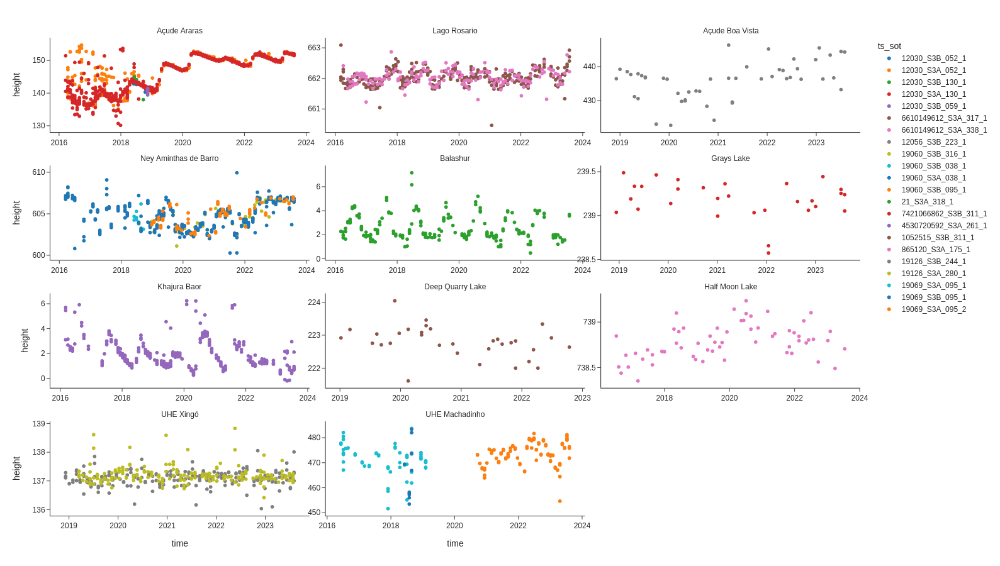

In [11]:
#Plot to exclude outliers
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go


df=df_files_filtered
x_fd='time'
y_fd='height'
facet='lake_name'
color='ts_sot'
fig = px.scatter(df, x=x_fd, y=y_fd, 
                 facet_col=facet,color=color,facet_col_wrap=3,
                 # color_discrete_sequence=["#7570b3","#d95f02"],
                 template="simple_white", width=1200, height=900)
# fig.update_traces(marker=dict(size=5,color='#661666'))
fig.update_xaxes(matches=None)
fig.update_yaxes(matches=None)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.for_each_yaxis(lambda y: y.update(showticklabels=True,matches=None))
fig.for_each_xaxis(lambda x: x.update(showticklabels=True,matches=None))

fig.show()
del df

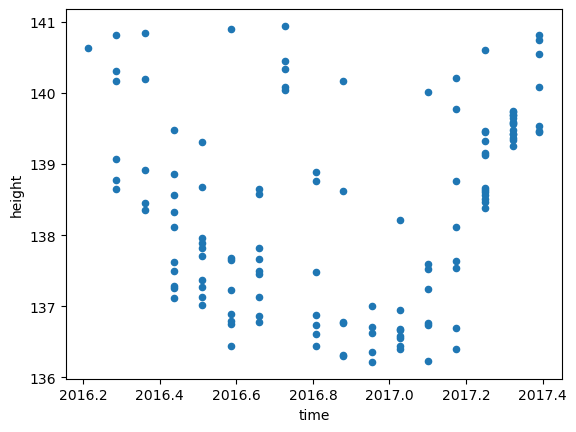

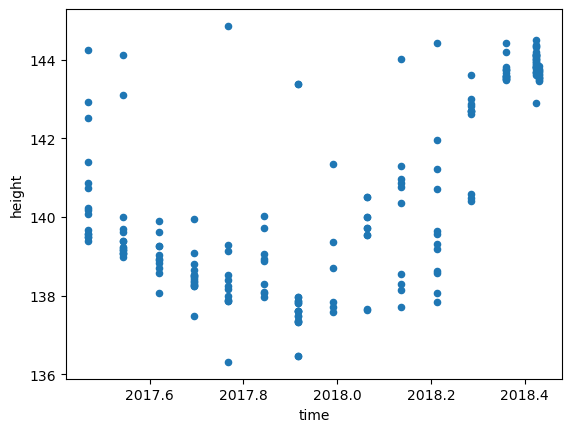

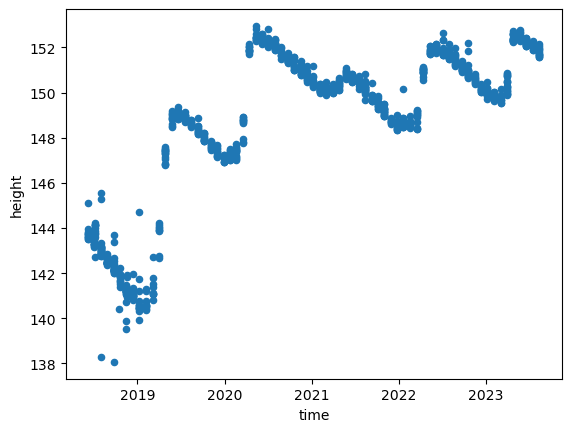

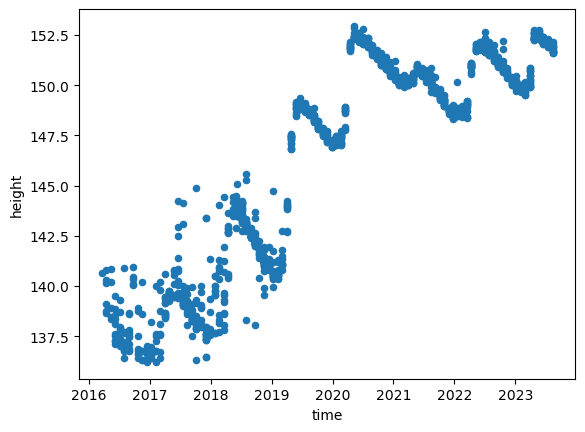

In [12]:
#Extra filter in Araras
df_files_filtered.loc[df_files_filtered['lake_id']=='12030']
#separate 2018.431
df1=df_files_filtered.loc[(df_files_filtered['lake_id']=='12030')&(df_files_filtered['time']<2017.392)&(df_files_filtered['height']<141)&(df_files_filtered['height']>136)].sort_values('time').copy()
df1.plot.scatter(x='time', y='height')
df2=df_files_filtered.loc[(df_files_filtered['lake_id']=='12030')&(df_files_filtered['time']>=2017.392)&(df_files_filtered['time']<2018.431)&(df_files_filtered['height']<145)&(df_files_filtered['height']>136)].sort_values('time').copy()
df2.plot.scatter(x='time', y='height')
df3=df_files_filtered.loc[(df_files_filtered['lake_id']=='12030')&(df_files_filtered['time']>=2018.431)].sort_values('time').copy()
df3.plot.scatter(x='time', y='height')
dff=pd.concat([df1,df2,df3],axis=0)
dff.plot.scatter(x='time', y='height')

#Extact full station from df_files_filtered, then put if back up
df_files_filtered=df_files_filtered.loc[df_files_filtered['lake_id']!='12030']
df_files_filtered=pd.concat([df_files_filtered, dff], axis=0)

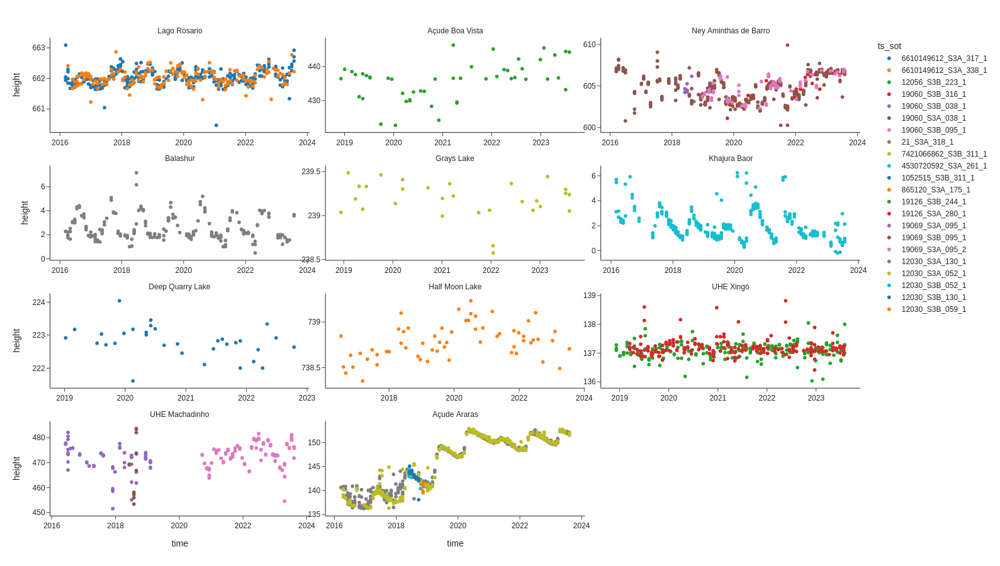

In [13]:
#Plot to exclude outliers
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go


df=df_files_filtered
x_fd='time'
y_fd='height'
facet='lake_name'
color='ts_sot'
fig = px.scatter(df, x=x_fd, y=y_fd, 
                 facet_col=facet,color=color,facet_col_wrap=3,
                 # color_discrete_sequence=["#7570b3","#d95f02"],
                 template="simple_white", width=1200, height=900)
# fig.update_traces(marker=dict(size=5,color='#661666'))
fig.update_xaxes(matches=None)
fig.update_yaxes(matches=None)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.for_each_yaxis(lambda y: y.update(showticklabels=True,matches=None))
fig.for_each_xaxis(lambda x: x.update(showticklabels=True,matches=None))

fig.show()
del df

In [14]:
# Pair data only in pairs filtered
df=df_files_filtered.copy()
ts_sot_list=df['ts_sot'].unique()
ts_sot_list

array(['6610149612_S3A_317_1', '6610149612_S3A_338_1', '12056_S3B_223_1',
       '19060_S3B_316_1', '19060_S3B_038_1', '19060_S3A_038_1',
       '19060_S3B_095_1', '21_S3A_318_1', '7421066862_S3B_311_1',
       '4530720592_S3A_261_1', '1052515_S3B_311_1', '865120_S3A_175_1',
       '19126_S3B_244_1', '19126_S3A_280_1', '19069_S3A_095_1',
       '19069_S3B_095_1', '19069_S3A_095_2', '12030_S3A_130_1',
       '12030_S3A_052_1', '12030_S3B_052_1', '12030_S3B_130_1',
       '12030_S3B_059_1'], dtype=object)

In [15]:
#For each orbit at that lake get the pair data 

df_final_SAR=pd.DataFrame()

for lsot in ts_sot_list:
    #get the lake from SAR
    df_lake_SAR=df.loc[df['ts_sot']==lsot].copy()
    
    lk_g=df_lake_SAR['lake_id'].iloc[0]
       
    # orbits=df_lake_SAR['orbit'].unique()
    # print(orbits, df_lake_SAR['lake_name'].unique())
    df_lake_SAR.columns=[i+'_SAR' for i in df_lake_SAR.columns]
    
    
    df_lake_g=df_ground_SAR.loc[df_ground_SAR['lake_id'].astype(int).astype(str)==lk_g]
    
    
    if not df_lake_g.empty:
        gauges=df_lake_g['gauge_id'].unique()
        for g in gauges:
        
            # print(ob)
            # print(df_lake_k)
            #rename columns in karinas file so it's not the same

            ob=df_lake_SAR['orbit_SAR'].iloc[0]
            df_lake_s=df_lake_SAR#df_lake_SAR.loc[df_lake_SAR['orbit_SAR']==ob]

            group_by_fd=['time_SAR']
            sum_dict={'height_SAR':['median','count', 'std'],
                      'sat_SAR':'first',
                      'orbit_SAR':'first',
                      'lake_id_SAR':'first',
                      'lake_name_SAR':'first',
                      'ts_sot_SAR':'first'}
            df_lake_SAR_median=aggregage_values_by_group(df_lake_s, group_by_fd, sum_dict)
            df_lake_SAR_median['SAR_mean_dev']=df_lake_SAR_median['height_SAR_median']-df_lake_SAR_median['height_SAR_median'].mean()

            lake_name=lk_g
            source=df_lake_g['source'].iloc[0]

            SAR_date_fd='time_SAR'
            ground_date_fd='decimal_y'
            df_lake_g_g=df_lake_g.loc[df_lake_g['gauge_id']==g]
            (df_SAR_c, df_ground_c)=get_common_period(df_ts1=df_lake_SAR_median, df_ts2=df_lake_g_g, 
                                                    date_ts1_fd=SAR_date_fd, date_ts2_fd=ground_date_fd, decimal_date=True)

            df_SAR_c['date_utc']=df_SAR_c['time_SAR'].map(decimalyear2yearmonthdayhour).map(convert_tuple_2_date)
            df_ground_c['date_utc']=df_ground_c['decimal_y'].map(decimalyear2yearmonthdayhour).map(convert_tuple_2_date)
            date_utc='date_utc'

            print('lake ID: '+lk_g+' Lake Name: '+df_SAR_c['lake_name_SAR_first'].unique()[0]+' Orbit: '+ob+' Satellite: '+df_SAR_c['sat_SAR_first'].unique()[0]+'\n')
            for delta in range (1,11):

                median_fd='median_d_'+str(delta)
                mean_fd='mean_d_'+str(delta)
                std_fd='std_d_'+str(delta)
                mad_fd='mad_d_'+str(delta) #Median absolute deviation
                count_fd='count_d_'+str(delta)
                criteria_fd='type_m_d_'+str(delta)


                # Get moving windows
                df_SAR_c[[median_fd,mad_fd, mean_fd, std_fd,count_fd, criteria_fd]]=df_SAR_c.apply(lambda x: moving_window_around_date(df_ground_c,
                                                                                                                  x[date_utc],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  date_utc), axis=1).apply(pd.Series)
                # Interpolate in moving windows                                                                                                  
                median_fd='val_w_int_d_'+str(delta)
                mean_fd='mean_w_int_d_'+str(delta)
                std_fd='std_w_int_d_'+str(delta)
                mad_fd='mad_w_int_d_'+str(delta) #Median absolute deviation
                count_fd='count_w_int_d_'+str(delta)
                criteria_fd='type_w_int_d_'+str(delta)


                # Get interpolate in moving windows
                df_SAR_c[[median_fd,mad_fd, mean_fd, std_fd,count_fd, criteria_fd]]=df_SAR_c.apply(lambda x: moving_window_around_date(df_ground_c,
                                                                                                                  x[date_utc],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  date_utc,
                                                                                                                   'linear'), axis=1).apply(pd.Series)

                #second approach, the closest date
                #delta=5
                val_cd_fd='val_cd_d_'+str(delta)
                criteria_fd='type_cd_d_'+str(delta)
                closer_dt_fd='ndays_cd_d_'+str(delta)
                mea_cd_fd='mea_cd_d_'+str(delta)
                std_cd_fd='std_cd_d_'+str(delta)
                mad_cd_fd='mad_cd_d_'+str(delta) #Median absolute deviation
                n_cd_fd='n_cd_d_'+str(delta)
                n_days_cd_fd='n_days_cd_d_'+str(delta)
                # Get closer value around a date if more than one median
                df_SAR_c[[val_cd_fd,criteria_fd,closer_dt_fd,mea_cd_fd, mad_cd_fd, std_cd_fd,n_cd_fd,n_days_cd_fd]]=df_SAR_c.apply(lambda x: closer_value_around_date(df_ground_c,
                                                                                                                  x[date_utc],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  date_utc), axis=1).apply(pd.Series)

                val_cd_fd='val_int_d_'+str(delta)
                criteria_fd='type_int_d_'+str(delta)
                closer_dt_fd='ndays_int_d_'+str(delta)
                mea_cd_fd='mea_int_d_'+str(delta)
                std_cd_fd='std_int_d_'+str(delta)
                mad_cd_fd='mad_int_d_'+str(delta) #Median absolute deviation
                n_cd_fd='n_int_d_'+str(delta)
                n_days_cd_fd='n_days_int_d_'+str(delta)
                # Get closer value around a date if more than one, linearly interpolate
                df_SAR_c[[val_cd_fd,criteria_fd,closer_dt_fd,mea_cd_fd, mad_cd_fd, std_cd_fd,n_cd_fd,n_days_cd_fd]]=df_SAR_c.apply(lambda x: closer_value_around_date(df_ground_c,
                                                                                                                  x[date_utc],
                                                                                                                  delta,
                                                                                                                  'height',
                                                                                                                  date_utc, 
                                                                                                                  'linear'), axis=1).apply(pd.Series)
            #Get interpolated data 
            datast1_2_ts2dy, corr_ts1ts2, ns_ts2, rmsd_ts2, ampl_ts1=interp_ts12ts2_stat(df_ground_c[ground_date_fd].to_numpy(), df_ground_c['height'].to_numpy(), 
                                            df_SAR_c[SAR_date_fd].to_numpy(), df_SAR_c['SAR_mean_dev'].to_numpy())

            df_SAR_c['int_height']=pd.Series(datast1_2_ts2dy)
            df_SAR_c['int_corr_ts1ts2']=corr_ts1ts2
            df_SAR_c['int_rmsd_ts2']=rmsd_ts2
            # add columns
            df_SAR_c['lake_name']=lake_name
            df_SAR_c['source']=df_ground_c['source'].iloc[0]
            df_SAR_c['lake_id']=lk_g
            df_SAR_c['orbit']=ob
            df_SAR_c['ts_sot_g']=lsot+'_'+g
            df_final_SAR=pd.concat((df_final_SAR,df_SAR_c), axis=0, ignore_index=True)

            
            

lake ID: 6610149612 Lake Name: Lago Rosario Orbit: 317 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 6610149612 Lake Name: Lago Rosario Orbit: 338 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 12056 Lake Name: Açude Boa Vista Orbit: 223 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19060 Lake Name: Ney Aminthas de Barro Orbit: 316 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19060 Lake Name: Ney Aminthas de Barro Orbit: 038 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19060 Lake Name: Ney Aminthas de Barro Orbit: 038 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19060 Lake Name: Ney Aminthas de Barro Orbit: 095 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 21 Lake Name: Balashur Orbit: 318 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 7421066862 Lake Name: Grays Lake Orbit: 311 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 4530720592 Lake Name: Khajura Baor Orbit: 261 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 1052515 Lake Name: Deep Quarry Lake Orbit: 311 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 865120 Lake Name: Half Moon Lake Orbit: 175 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19126 Lake Name: UHE Xingó Orbit: 244 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19126 Lake Name: UHE Xingó Orbit: 280 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19069 Lake Name: UHE Machadinho Orbit: 095 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19069 Lake Name: UHE Machadinho Orbit: 095 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 19069 Lake Name: UHE Machadinho Orbit: 095 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 12030 Lake Name: Açude Araras Orbit: 130 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 12030 Lake Name: Açude Araras Orbit: 052 Satellite: S3A



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 12030 Lake Name: Açude Araras Orbit: 052 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 12030 Lake Name: Açude Araras Orbit: 130 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

lake ID: 12030 Lake Name: Açude Araras Orbit: 059 Satellite: S3B



/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_2588651/2489223135.py:98:

In [16]:
df_final_SAR['lake_name_SAR_first'].unique()

array(['Lago Rosario', 'Açude Boa Vista', 'Ney Aminthas de Barro',
       'Balashur', 'Grays Lake', 'Khajura Baor', 'Deep Quarry Lake',
       'Half Moon Lake', 'UHE Xingó', 'UHE Machadinho', 'Açude Araras'],
      dtype=object)

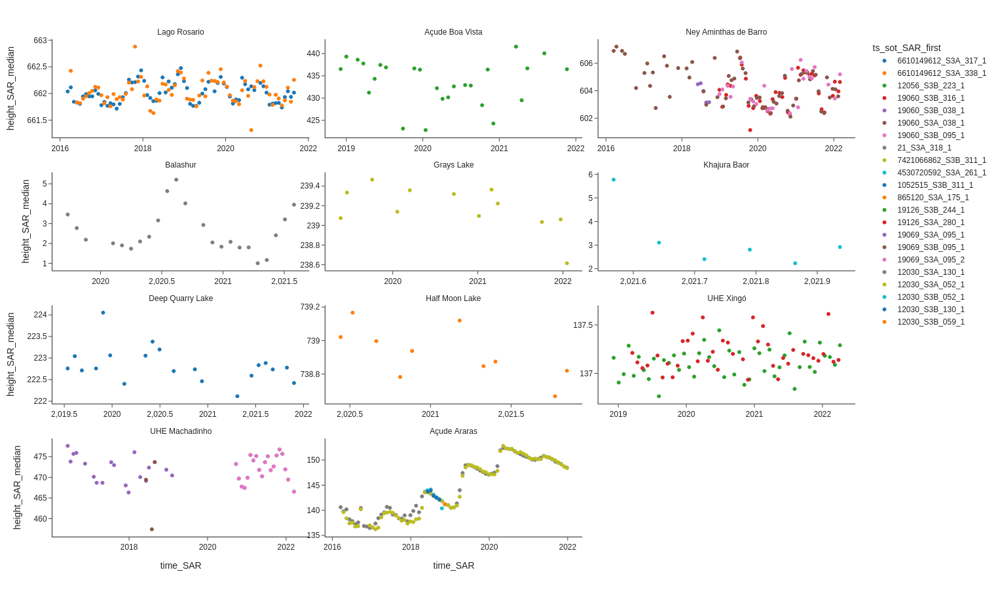

In [17]:
#Plot Final outcome
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go


df=df_final_SAR
x_fd='time_SAR'
y_fd='height_SAR_median'
facet='lake_name_SAR_first'
color='ts_sot_SAR_first'
fig = px.scatter(df, x=x_fd, y=y_fd, 
                 facet_col=facet,color=color,facet_col_wrap=3,
                 # color_discrete_sequence=["#7570b3","#d95f02"],
                 template="simple_white", width=1200, height=900)
# fig.update_traces(marker=dict(size=5,color='#661666'))
fig.update_xaxes(matches=None)
fig.update_yaxes(matches=None)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.for_each_yaxis(lambda y: y.update(showticklabels=True,matches=None))
fig.for_each_xaxis(lambda x: x.update(showticklabels=True,matches=None))

fig.show()
del df

In [58]:
time_file=datetime.now().strftime("%Y%m%d_%H_%M")
# df_ground_ts.to_csv('../data/results/data_preprocessed.csv', sep=',')
#Backup
df_final_SAR.to_csv('../data/results/data_preprocessed_SAR_sel'+time_file+'.csv', sep=',')

In [18]:
df_final_SAR.ts_sot_g.unique()

array(['6610149612_S3A_317_1_2234', '6610149612_S3A_338_1_2234',
       '12056_S3B_223_1_12056', '19060_S3B_316_1_19060',
       '19060_S3B_038_1_19060', '19060_S3A_038_1_19060',
       '19060_S3B_095_1_19060', '21_S3A_318_1_BLB2',
       '7421066862_S3B_311_1_YSL2', '4530720592_S3A_261_1_KHB2',
       '1052515_S3B_311_1_QUL2', '865120_S3A_175_1_HMT2',
       '19126_S3B_244_1_19126', '19126_S3A_280_1_19126',
       '19069_S3A_095_1_19069', '19069_S3B_095_1_19069',
       '19069_S3A_095_2_19069', '12030_S3A_130_1_12030',
       '12030_S3A_052_1_12030', '12030_S3B_052_1_12030',
       '12030_S3B_130_1_12030', '12030_S3B_059_1_12030'], dtype=object)

In [59]:
time_file

'20231108_19_14'